In [1]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import os

/Users/tbui0020/anaconda3/lib/python3.11/site-packages/pandas/core/arrays/masked.py:60: UserWarning: Pandas requires version '1.3.6' or newer of 'bottleneck' (version '1.3.5' currently installed).
  from pandas.core import (


In [16]:
# 'evaluation_folder/compvis-word_{EnglishSpringer}-target_-method_xattn-sg_3-ng_1-iter_1000-lr_1e-05-info_none-netfive_100.csv'
template = 'evaluation_folder/compvis-word_{}-target_{}-method_xattn-sg_3-ng_1-iter_1000-lr_1e-05-info_SDv21-netfive_100.csv'
SD = pd.read_csv('evaluation_folder/SD-v2-1-netfive_100.csv')

results = {}
jobs = {}

_jobs = [
        'English Springer',
        'Clumber Spaniel', 
        'English Setter', 
        'Blenheim Spaniel',
        'Border Collie',
        'Garbage Truck',
        'Moving Van', 
        'Fire Engine', 
        'Ambulance', 
        'School Bus',
        'French Horn',
        'Bassoon', 
        'Trombone', 
        'Oboe', 
        'Saxophone',
        'Church',
        'Monastery', 
        'Bell Cote', 
        'Dome', 
        'Library',
        'Cassette Player',
        'Polaroid Camera', 
        'Loudspeaker', 
        'Typewriter Keyboard', 
        'Projector'
        ]

jobs['target_empty'] = {k: [''] for k in _jobs}


_jobs = [
        'English Springer',
        'Clumber Spaniel', 
        'English Setter', 
        'Blenheim Spaniel',
        'Border Collie',
        'Garbage Truck',
        'Moving Van', 
        'Fire Engine', 
        'Ambulance', 
        'School Bus',
        'French Horn',
        'Bassoon', 
        'Trombone', 
        'Oboe', 
        'Saxophone',
        'Church',
        'Monastery', 
        'Bell Cote', 
        'Dome', 
        'Library',
        'Cassette Player',
        'Polaroid Camera', 
        'Loudspeaker', 
        'Typewriter Keyboard', 
        'Projector',
        'Van Gogh',
        'Taylor Swift',
        'gun',
        'nudity',
        'dog', 
        'truck',
        'musical instrument',
        'building',
        'audio device',        
        ]

jobs['target_empty_full'] = {k: [''] for k in _jobs}

_jobs = [
        'Van Gogh',
        'Taylor Swift',
        'gun',
        'nudity',
        'dog', 
        'truck',
        'musical instrument',
        'building',
        'audio device',
        ]

jobs['target_empty_general'] = {k: [''] for k in _jobs}



jobs['target_specific'] = {
        'English Springer': ['Springer Spaniel', 'Clumber Spaniel', 'Border Collie', 'Dog', 
                            #  'Garbage Truck', 
                            #  'French Horn', 
                             ''], 
        'Garbage Truck': ['Waste Collection Vehicle', 'Moving Van', 'School Bus', 'Truck', 
                        #   'French Horn', 
                        #   'Church', 
                          ''], 
        'French Horn': ['Brass Horn', 'Bassoon', 'Saxophone', 'Musical Instrument Horn', 
                        # 'Church', 
                        # 'Cassette Player', 
                        ''], 
        'Church': ['Chapel', 'Monastery', 'Library', 'Building', 
                #    'Cassette Player', 
                #    'English Springer', 
                   ''], 
        'Cassette Player': ['Tape Player', 'Polaroid Camera', 'Projector', 'Audio Device', 
                            # 'English Springer', 
                            # 'Garbage Truck', 
                            ''], 
}

for exp in jobs:
    results[exp] = {}
    for k, v in jobs[exp].items():
        for vv in v:
            _k = k.replace(' ', '')
            _v = vv.replace(' ', '')
            if k not in results[exp]:
                results[exp][k] = {}
            results[exp][k][vv] = pd.read_csv(template.format(_k, _v))

In [17]:
all_classes = [
        'English Springer', 'Clumber Spaniel', 'English Setter', 'Blenheim Spaniel', 'Border Collie',
        'Garbage Truck', 'Moving Van', 'Fire Engine', 'Ambulance', 'School Bus',
        'French Horn', 'Bassoon', 'Trombone', 'Oboe', 'Saxophone',
        'Church', 'Monastery', 'Bell Cote', 'Dome', 'Library',
        'Cassette Player', 'Polaroid Camera', 'Loudspeaker', 'Typewriter Keyboard', 'Projector'
        ]

from imagenet_labels import IMAGENET_1K

def convert_label_to_index(label):
    for k, v in IMAGENET_1K.items():
        if label.lower() in v.lower():
            return k
    return -1

all_classes_index = {x: convert_label_to_index(x) for x in all_classes}

print(all_classes_index)

def count_correct(results, all_classes_index, return_sta=False):
    corrects = {x: 0 for x in all_classes_index}
    corrects_5 = {x: 0 for x in all_classes_index}
    scores = {x: 0 for x in all_classes_index}
    scores_5 = {x: 0 for x in all_classes_index}
    total = {x: 0 for x in all_classes_index}
    
    all_scores = {x: [] for x in all_classes_index}
    all_scores_5 = {x: [] for x in all_classes_index}

    for label, p1, p2, p3, p4, p5, s1, s2, s3, s4, s5 in zip(results['label_str'], results['index_top1'], results['index_top2'], results['index_top3'], results['index_top4'], results['index_top5'], 
                                                             results['scores_top1'], results['scores_top2'], results['scores_top3'], results['scores_top4'], results['scores_top5']):
        label_index = all_classes_index[label]
        total[label] += 1 # Count the number of samples for each class

        if label_index == p1:
            corrects[label] += 1
            scores[label] += s1
            all_scores[label].append(s1)
        else:
            all_scores[label].append(0)

        if label_index in [p1, p2, p3, p4, p5]:
            # total[label] += 1 # count the top-5 prediction only if the label is in top-5
            corrects_5[label] += 1
            if label_index == p1:
                _s = s1
            elif label_index == p2:
                _s = s2
            elif label_index == p3:
                _s = s3
            elif label_index == p4:
                _s = s4
            elif label_index == p5:
                _s = s5

            scores_5[label] += _s
            all_scores_5[label].append(_s)
        else:
            all_scores_5[label].append(0)

    scores = {k: v / total[k] for k, v in scores.items()}
    scores_5 = {k: v / total[k] for k, v in scores_5.items()}
    sta_scores = {k: [np.mean(v), np.std(v)] for k, v in all_scores.items()} # sta_scores-mean is different with the scores, because the scores is averaged over the total number of samples 
    sta_scores_5 = {k: [np.mean(v), np.std(v)] for k, v in all_scores_5.items()}

    if return_sta:
        return corrects, corrects_5, scores, scores_5, total, sta_scores, sta_scores_5
    else:
        return corrects, corrects_5, scores, scores_5, total



SD_corrects, SD_corrects_5, SD_scores, SD_scores_5, SD_total, SD_sta_scores, SD_sta_scores_5 = count_correct(SD, all_classes_index, return_sta=True)

print('------------------------------------')
print('SD')
print('top1:', SD_corrects)
print('top5:', SD_corrects_5)
print('scores', SD_scores)
print('scores_5', SD_scores_5)
print('SD_sta_scores -  mean', {k: v[0] for k, v in SD_sta_scores.items()})
print('SD_sta_scores -  std', {k: v[1] for k, v in SD_sta_scores.items()})
print('SD_sta_scores_5 -  mean', {k: v[0] for k, v in SD_sta_scores_5.items()})
print('SD_sta_scores_5 -  std', {k: v[1] for k, v in SD_sta_scores_5.items()}) 


def cal_acc(results, erased_classes, preseved_classes):
    correct = 0
    num_samples = 0
    top5_correct = 0
    for label, p1, p2, p3, p4, p5 in zip(results['label_str'], results['category_top1'], results['category_top2'], results['category_top3'], results['category_top4'], results['category_top5']):
        if label.lower() in erased_classes:
            num_samples += 1
            if (label.lower() not in [p1.lower()]):
                correct += 1
            if (label.lower() not in [p1.lower(), p2.lower(), p3.lower(), p4.lower(), p5.lower()]):
                top5_correct += 1
    
    esr_1 = correct / num_samples
    esr_5 = top5_correct / num_samples

    # print('Preserving Success Rate - top1')
    correct = 0
    num_samples = 0
    top5_correct = 0
    for label, p1, p2, p3, p4, p5 in zip(results['label_str'], results['category_top1'], results['category_top2'], results['category_top3'], results['category_top4'], results['category_top5']):
        if label.lower() in preseved_classes:
            num_samples += 1
            if (label.lower() in [p1.lower()]):
                correct += 1
            if (label.lower() in [p1.lower(), p2.lower(), p3.lower(), p4.lower(), p5.lower()]):
                top5_correct += 1

    psr_1 = correct / num_samples
    psr_5 = top5_correct / num_samples

    return esr_1, esr_5, psr_1, psr_5

def cal_acc_index(results, erased_classes, preseved_classes):
    correct = 0 
    num_samples = 0
    top5_correct = 0

    for label, p1, p2, p3, p4, p5 in zip(results['label_str'], results['index_top1'], results['index_top2'], results['index_top3'], results['index_top4'], results['index_top5']):
        if label.lower() in erased_classes:
            num_samples += 1
            label_index = all_classes_index[label]

            if (label_index != p1):
                correct += 1
            
            if (label_index not in [p1, p2, p3, p4, p5]):
                top5_correct += 1
    
    if num_samples == 0:
        esr_1 = 0
        esr_5 = 0
    else:
        esr_1 = correct / num_samples
        esr_5 = top5_correct / num_samples    

    # print('Preserving Success Rate - top1')

    correct = 0
    num_samples = 0
    top5_correct = 0

    for label, p1, p2, p3, p4, p5 in zip(results['label_str'], results['index_top1'], results['index_top2'], results['index_top3'], results['index_top4'], results['index_top5']):
        if label.lower() in preseved_classes:
            num_samples += 1
            label_index = all_classes_index[label]

            if (label_index == p1):
                correct += 1
            
            if (label_index in [p1, p2, p3, p4, p5]):
                top5_correct += 1
    
    if num_samples == 0:
        psr_1 = 0 
        psr_5 = 0
    else:
        psr_1 = correct / num_samples
        psr_5 = top5_correct / num_samples

    return esr_1, esr_5, psr_1, psr_5

for exp in jobs:
    print('------------------------------------')
    for k, vv in jobs[exp].items():
        for v in vv:
            erased_classes = [k.lower()]
            preseved_classes = all_classes.copy()
            if k in preseved_classes:
                preseved_classes.remove(k)
            preseved_classes = [x.lower() for x in preseved_classes]

            esr_1_index, esr_5_index, psr_1_index, psr_5_index = cal_acc_index(results[exp][k][v], erased_classes, preseved_classes)
            count_corrects, count_corrects_5, scores, scores_5, _, sta_scores, sta_scores_5 = count_correct(results[exp][k][v], all_classes_index, return_sta=True)

            print(f'Experiment: {exp}, Erased: {k}, Target: {v}')
            print(f'ESR-1: {esr_1_index}, ESR-5: {esr_5_index}, PSR-1: {psr_1_index}, PSR-5: {psr_5_index}')
            print('top1:', count_corrects)
            print('top5:', count_corrects_5)
            print('scores', scores)
            print('scores_5', scores_5)
            print('sta_scores - mean', {k: v[0] for k, v in sta_scores.items()})
            print('sta_scores - std', {k: v[1] for k, v in sta_scores.items()})
            print('sta_scores_5 - mean', {k: v[0] for k, v in sta_scores_5.items()})
            print('sta_scores_5 - std', {k: v[1] for k, v in sta_scores_5.items()}) 

            # esr_1, esr_5, psr_1, psr_5 = cal_acc(results[exp][k], erased_classes, preseved_classes)
            # print(f'Experiment: {exp}, Erased: {k}, Target: {v}')
            # print(f'ESR-1: {esr_1}, ESR-5: {esr_5}, PSR-1: {psr_1}, PSR-5: {psr_5}')

            # if esr_1 != esr_1_index or esr_5 != esr_5_index or psr_1 != psr_1_index or psr_5 != psr_5_index:
            #     print('Mismatch')


{'English Springer': 217, 'Clumber Spaniel': 216, 'English Setter': 212, 'Blenheim Spaniel': 156, 'Border Collie': 232, 'Garbage Truck': 569, 'Moving Van': 675, 'Fire Engine': 555, 'Ambulance': 407, 'School Bus': 779, 'French Horn': 566, 'Bassoon': 432, 'Trombone': 875, 'Oboe': 683, 'Saxophone': 776, 'Church': 497, 'Monastery': 663, 'Bell Cote': 442, 'Dome': 538, 'Library': 624, 'Cassette Player': 482, 'Polaroid Camera': 732, 'Loudspeaker': 632, 'Typewriter Keyboard': 878, 'Projector': 745}
------------------------------------
SD
top1: {'English Springer': 100, 'Clumber Spaniel': 88, 'English Setter': 54, 'Blenheim Spaniel': 35, 'Border Collie': 100, 'Garbage Truck': 81, 'Moving Van': 75, 'Fire Engine': 100, 'Ambulance': 96, 'School Bus': 100, 'French Horn': 100, 'Bassoon': 54, 'Trombone': 46, 'Oboe': 80, 'Saxophone': 94, 'Church': 99, 'Monastery': 84, 'Bell Cote': 4, 'Dome': 90, 'Library': 100, 'Cassette Player': 16, 'Polaroid Camera': 71, 'Loudspeaker': 84, 'Typewriter Keyboard': 95,

In [18]:
def convert_label(label):
    if label == 'target_empty':
        return 'Target = ""'
    elif label == 'target_subsetno2':
        return 'Target = Top-2 in Subset'
    elif label == 'target_round':
        return 'Target = Round Robin'
    elif label == 'delta_top5':
        return r'$\Delta$ DS-5'
    elif label == 'delta_top1':
        return r'$\Delta$ DS-1'
    elif label == 'delta_scores_5':
        return r'$\Delta$ CS-5'
    elif label == 'delta_scores':
        return r'$\Delta$ CS-1'
    else:
        return label

def convert_label_map(jobs_dict):
    """
    Input: 
    {'English Springer': ['Garbage Truck'],
    'Garbage Truck': ['French Horn'],
    'French Horn': ['Church'],
    'Church': ['Cassette Player'],
    'Cassette Player': ['English Springer']}

    Return:
    [ r'English Springer $\rightarrow$ Garbage Truck',
    r'Garbage Truck $\rightarrow$ French Horn',
    r'French Horn $\rightarrow$ Church',
    r'Church $\rightarrow$ Cassette Player',
    r'Cassette Player $\rightarrow$ English Springer']
    ]
    """    
    ret = []
    for k, vv in jobs_dict.items():
        for v in vv:
            ret.append(rf'{k} $\rightarrow$ {v}')
    return ret

def assign_color(label):

    if rf'$\rightarrow$' in label:
        print(label)
        label = label.split(rf' $\rightarrow$ ')[0]
        
    if label in ['English Springer', 'Clumber Spaniel', 'English Setter', 'Blenheim Spaniel', 'Border Collie']:
        return 'red'
    elif label in ['Garbage Truck', 'Moving Van', 'Fire Engine', 'Ambulance', 'School Bus']:    
        return 'blue'
    elif label in ['French Horn', 'Bassoon', 'Trombone', 'Oboe', 'Saxophone']:
        return 'green'
    elif label in ['Church', 'Monastery', 'Bell Cote', 'Dome', 'Library']:
        return 'orange'
    elif label in ['Cassette Player', 'Polaroid Camera', 'Loudspeaker', 'Typewriter Keyboard', 'Projector']:
        return 'purple'
    else:
        return 'black'
        

------------------------------------
SD
top1: {'English Springer': 100, 'Clumber Spaniel': 88, 'English Setter': 54, 'Blenheim Spaniel': 35, 'Border Collie': 100, 'Garbage Truck': 81, 'Moving Van': 75, 'Fire Engine': 100, 'Ambulance': 96, 'School Bus': 100, 'French Horn': 100, 'Bassoon': 54, 'Trombone': 46, 'Oboe': 80, 'Saxophone': 94, 'Church': 99, 'Monastery': 84, 'Bell Cote': 4, 'Dome': 90, 'Library': 100, 'Cassette Player': 16, 'Polaroid Camera': 71, 'Loudspeaker': 84, 'Typewriter Keyboard': 95, 'Projector': 43}
top5: {'English Springer': 100, 'Clumber Spaniel': 100, 'English Setter': 95, 'Blenheim Spaniel': 89, 'Border Collie': 100, 'Garbage Truck': 100, 'Moving Van': 100, 'Fire Engine': 100, 'Ambulance': 100, 'School Bus': 100, 'French Horn': 100, 'Bassoon': 93, 'Trombone': 99, 'Oboe': 94, 'Saxophone': 100, 'Church': 100, 'Monastery': 100, 'Bell Cote': 40, 'Dome': 100, 'Library': 100, 'Cassette Player': 96, 'Polaroid Camera': 97, 'Loudspeaker': 99, 'Typewriter Keyboard': 100, 'Pr

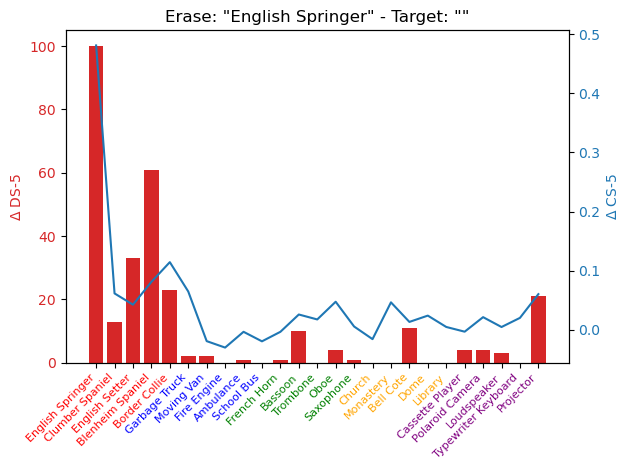

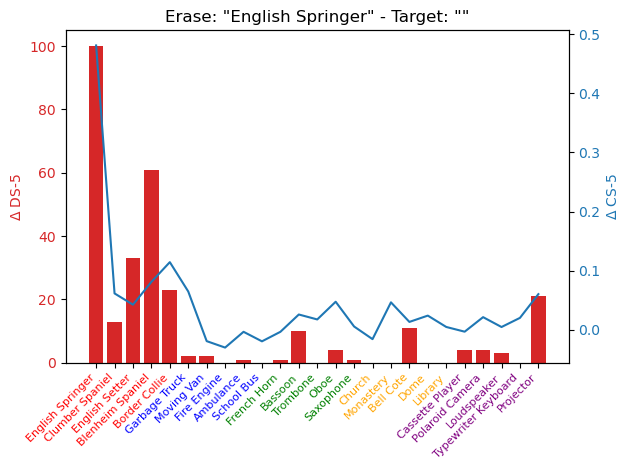

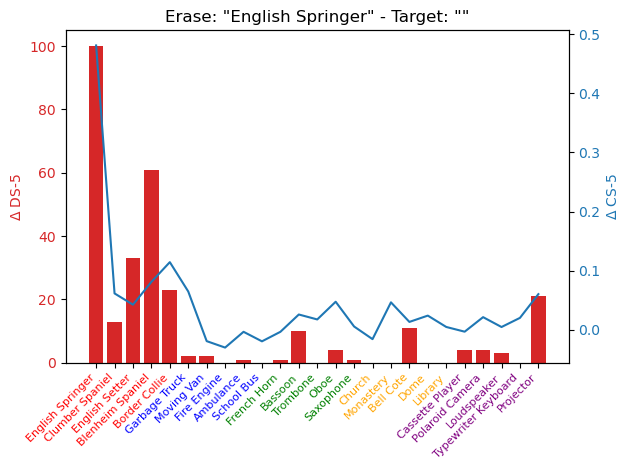

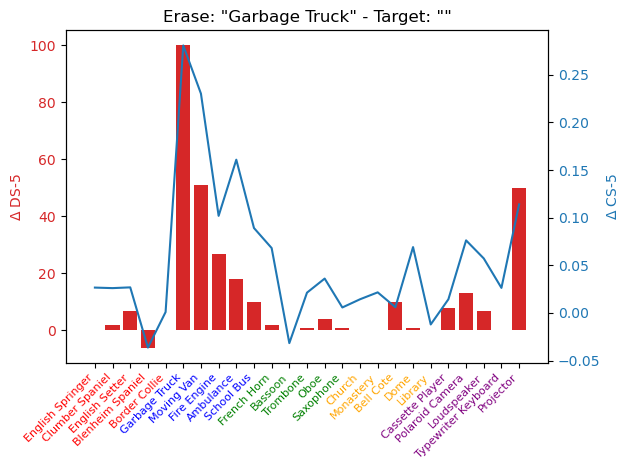

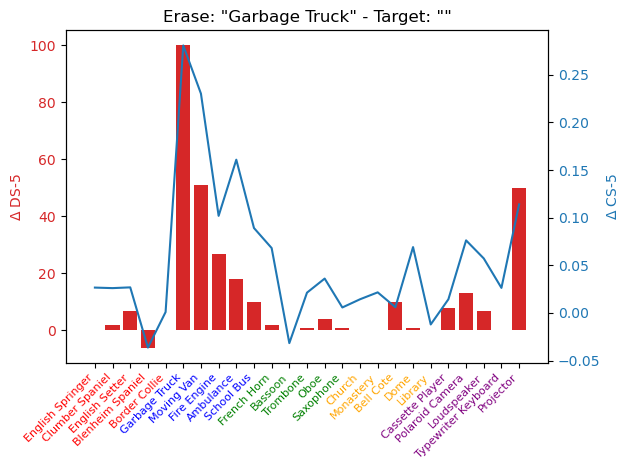

...

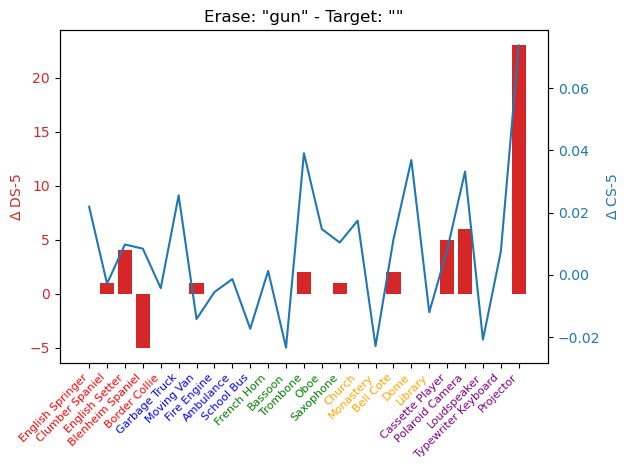

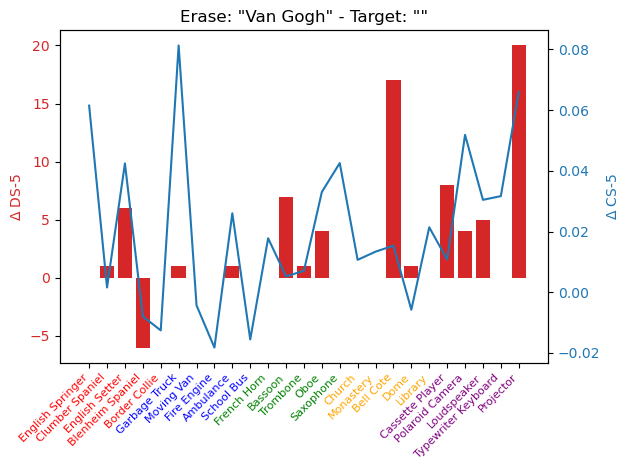

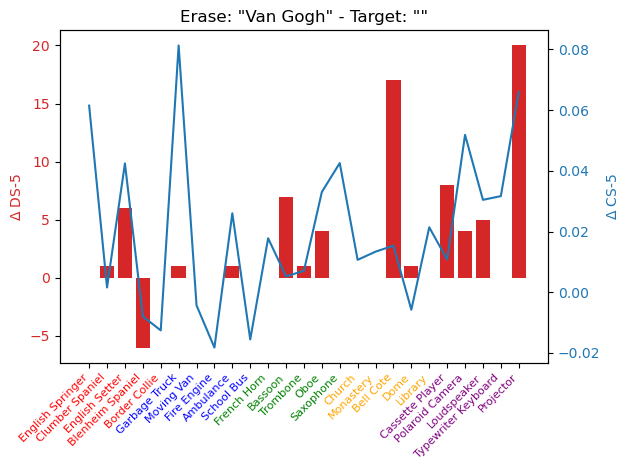

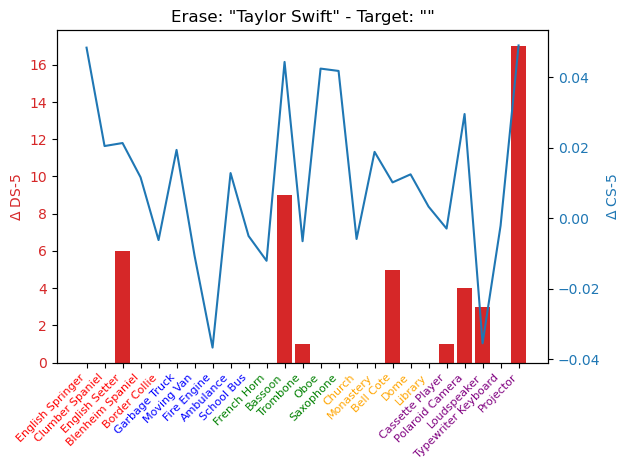

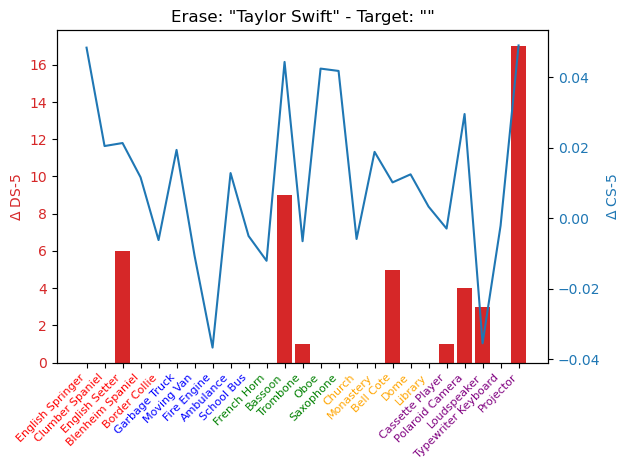

In [19]:
print('------------------------------------')
print('SD')
print('top1:', SD_corrects)
print('top5:', SD_corrects_5)
print('scores', SD_scores)
print('scores_5', SD_scores_5)

os.makedirs('results/netfive', exist_ok=True)

for concept in ['English Springer', 'Garbage Truck', 'French Horn', 'gun', 'Van Gogh', 'Taylor Swift']:

    for exp in jobs:

        if concept not in jobs[exp]:
            continue

        target = list(jobs[exp][concept])[-1]

        print('------------------------------------')
        print(f'Experiment: {exp}, Erased: {concept}, Target: {target}')
        k = concept
        erased_classes = [k.lower()]
        preseved_classes = all_classes.copy()
        if k in preseved_classes:
            preseved_classes.remove(k)
        preseved_classes = [x.lower() for x in preseved_classes]

        esr_1_index, esr_5_index, psr_1_index, psr_5_index = cal_acc_index(results[exp][k][target], erased_classes, preseved_classes)
        count_corrects, count_corrects_5, scores, scores_5, _ = count_correct(results[exp][k][target], all_classes_index)


        print(f'ESR-1: {esr_1_index}, ESR-5: {esr_5_index}, PSR-1: {psr_1_index}, PSR-5: {psr_5_index}')

        delta_top1 = {k: SD_corrects[k] - count_corrects[k] for k in count_corrects}
        delta_top5 = {k: SD_corrects_5[k] - count_corrects_5[k] for k in count_corrects_5}
        delta_scores = {k: SD_scores[k] - scores[k] for k in scores}
        delta_scores_5 = {k: SD_scores_5[k] - scores_5[k] for k in scores_5}

        print('delta_top5:', delta_top5)
        print('delta_scores_5:', delta_scores_5)

        # plot bar chart with two y-axis, one for delta_top1, one for delta_scores
        fig, ax1 = plt.subplots()

        color = 'tab:red'
        # ax1.set_xlabel('Classes')
        ax1.set_ylabel(convert_label('delta_top5'), color=color)
        ax1.bar(delta_top5.keys(), delta_top5.values(), color=color)
        ax1.tick_params(axis='y', labelcolor=color)

        # Rotate x-axis labels and apply assign_color
        plt.xticks(rotation=45, ha='right', fontsize=8)
        for label in ax1.get_xticklabels():
            label.set_color(assign_color(label.get_text()))

        ax2 = ax1.twinx()
        color = 'tab:blue'
        ax2.set_ylabel(convert_label('delta_scores_5'), color=color)
        ax2.plot(delta_scores_5.keys(), delta_scores_5.values(), color=color)
        ax2.tick_params(axis='y', labelcolor=color)

        plt.title(f'Erase: "{concept}" - Target: "{target}"')

        fig.tight_layout()

        plt.savefig(f'results/netfive/erase_{concept}_target_{target}.png', dpi=300, bbox_inches='tight')

Experiment: target_empty, Erased: English Springer, Target: 
ESR-1: 1.0, ESR-5: 1.0, PSR-1: 0.6620833333333334, PSR-5: 0.8691666666666666
top1: {'English Springer': 0, 'Clumber Spaniel': 73, 'English Setter': 33, 'Blenheim Spaniel': 10, 'Border Collie': 66, 'Garbage Truck': 63, 'Moving Van': 79, 'Fire Engine': 100, 'Ambulance': 95, 'School Bus': 100, 'French Horn': 95, 'Bassoon': 51, 'Trombone': 37, 'Oboe': 63, 'Saxophone': 94, 'Church': 99, 'Monastery': 77, 'Bell Cote': 3, 'Dome': 82, 'Library': 100, 'Cassette Player': 17, 'Polaroid Camera': 57, 'Loudspeaker': 88, 'Typewriter Keyboard': 85, 'Projector': 22}
top5: {'English Springer': 0, 'Clumber Spaniel': 87, 'English Setter': 62, 'Blenheim Spaniel': 28, 'Border Collie': 77, 'Garbage Truck': 98, 'Moving Van': 98, 'Fire Engine': 100, 'Ambulance': 99, 'School Bus': 100, 'French Horn': 99, 'Bassoon': 83, 'Trombone': 99, 'Oboe': 90, 'Saxophone': 99, 'Church': 100, 'Monastery': 100, 'Bell Cote': 29, 'Dome': 100, 'Library': 100, 'Cassette P

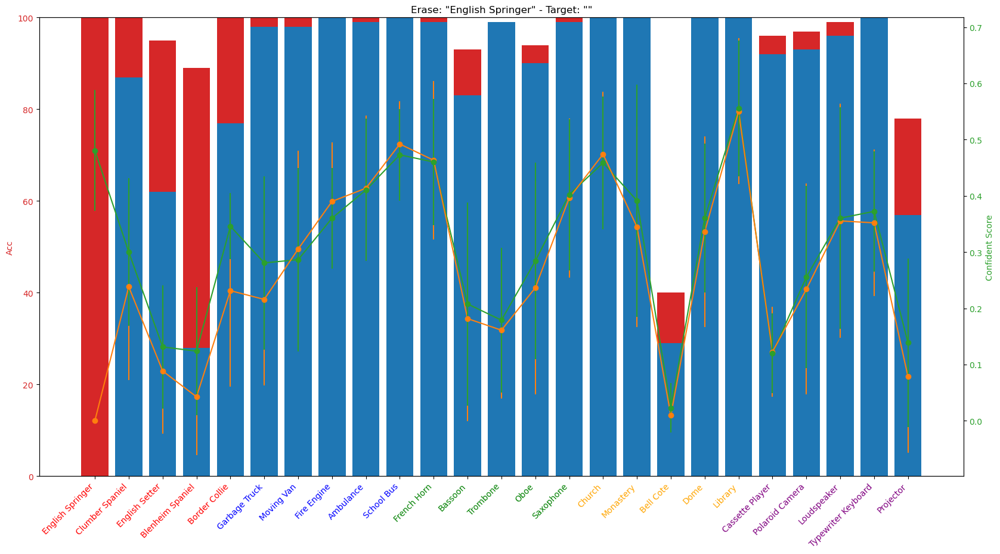

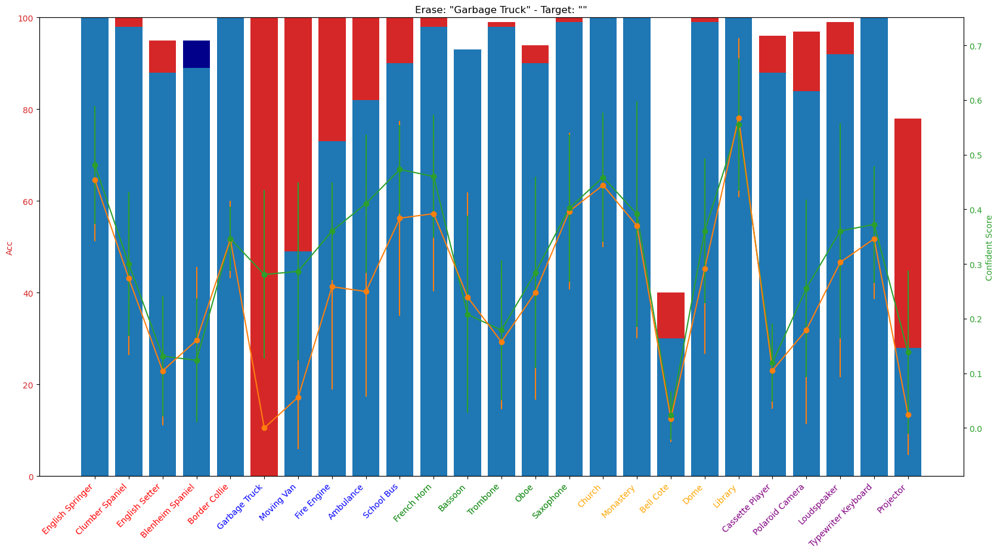

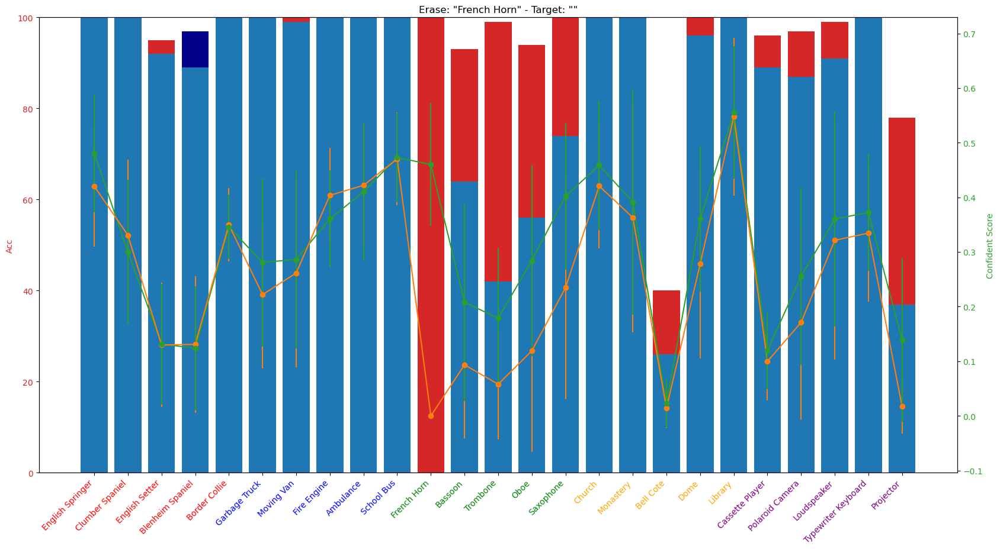

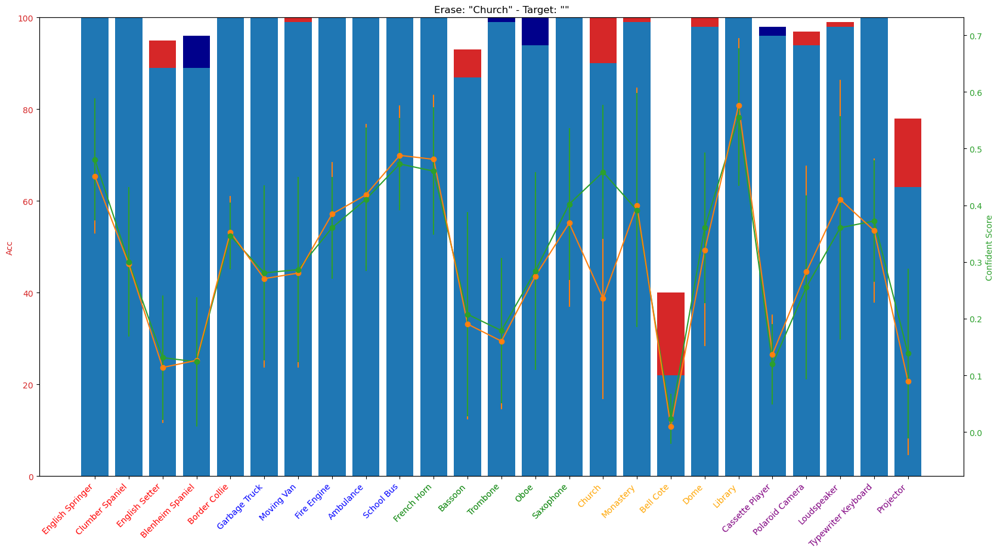

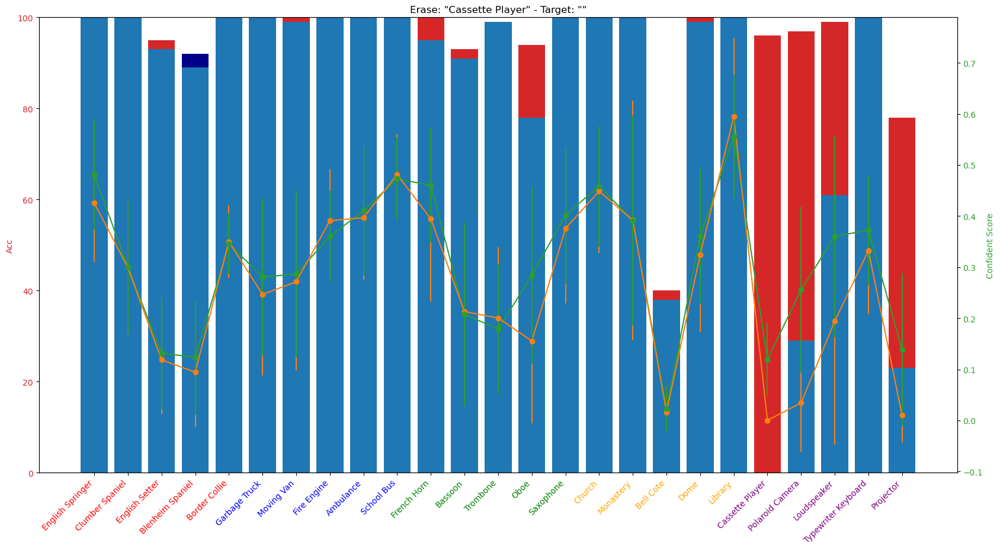

In [20]:
plot_error_bar = True
error_bar_scale = 1
exp = 'target_empty'
num_jobs = 2
font_size = 10

for concept in ['English Springer', 'Garbage Truck', 'French Horn', 'Church', 'Cassette Player']:

    fig, ax = plt.subplots(figsize=(20, 10))
    # ------------------------------------------------

    i = 0


    target = list(jobs[exp][concept])[0]

    k = concept
    erased_classes = [k.lower()]
    preseved_classes = all_classes.copy()
    preseved_classes.remove(k)
    preseved_classes = [x.lower() for x in preseved_classes]

    esr_1_index, esr_5_index, psr_1_index, psr_5_index = cal_acc_index(results[exp][k][target], erased_classes, preseved_classes)
    count_corrects, count_corrects_5, scores, scores_5, _, sta_scores, sta_scores_5 = count_correct(results[exp][k][target], all_classes_index, return_sta=True)


    delta_top1 = {k: SD_corrects[k] - count_corrects[k] for k in count_corrects}
    delta_top5 = {k: SD_corrects_5[k] - count_corrects_5[k] for k in count_corrects_5}
    delta_scores = {k: SD_scores[k] - scores[k] for k in scores}
    delta_scores_5 = {k: SD_scores_5[k] - scores_5[k] for k in scores_5}

    classes = list(delta_top5.keys())
    SD_top5_values = list(SD_corrects_5.values())
    cur_top5_values = list(count_corrects_5.values())
    delta_top5_values = list(delta_top5.values())

    print(f'Experiment: {exp}, Erased: {k}, Target: {v}')
    print(f'ESR-1: {esr_1_index}, ESR-5: {esr_5_index}, PSR-1: {psr_1_index}, PSR-5: {psr_5_index}')
    print('top1:', count_corrects)
    print('top5:', count_corrects_5)
    print('scores', scores)
    print('scores_5', scores_5)
    print('sta_scores - mean', {k: v[0] for k, v in sta_scores.items()})
    print('sta_scores - std', {k: v[1] for k, v in sta_scores.items()})
    print('sta_scores_5 - mean', {k: v[0] for k, v in sta_scores_5.items()})
    print('sta_scores_5 - std', {k: v[1] for k, v in sta_scores_5.items()}) 
    # plot in this subplot a bar chart with two y-axis, one for delta_top1, one for delta_scores
    color = 'tab:red'

    ax.set_ylabel(convert_label('Acc'), color=color)
    ax.tick_params(axis='y', labelcolor=color)

    delta_colors = ['tab:red' if v > 0 else 'darkblue' for v in delta_top5_values]
    bot_cur_top5_values = cur_top5_values

    ax.bar(classes, cur_top5_values, color='tab:blue', label=convert_label('cur_top5_values'))
    ax.bar(classes, delta_top5_values, color=delta_colors, label=convert_label('delta_scores_5'), bottom=bot_cur_top5_values)

    # Rotate x-axis labels and apply assign_color
    plt.xticks(rotation=45, ha='right', fontsize=font_size)
    for label in ax.get_xticklabels():
        label.set_color(assign_color(label.get_text()))

    ax2 = ax.twinx()
    color = 'tab:green'
    ax2.set_ylabel(convert_label('Confident Score'), color=color)
    ax2.plot(SD_scores_5.keys(), SD_scores_5.values(), color='tab:green', label=convert_label('SD_scores_5'))
    ax2.plot(scores_5.keys(), scores_5.values(), color='tab:orange', label=convert_label('scores_5'))
    ax2.tick_params(axis='y', labelcolor=color)

    if plot_error_bar:
        ax2.errorbar(classes, scores_5.values(), yerr=[error_bar_scale * v[1] for v in sta_scores_5.values()], fmt='o', color='tab:orange', label=convert_label('scores_5'))
        ax2.errorbar(classes, SD_scores_5.values(), yerr=[error_bar_scale * v[1] for v in SD_sta_scores_5.values()], fmt='o', color='tab:green', label=convert_label('SD_scores_5'))

    plt.title(f'Erase: "{concept}" - Target: "{target}"')

    plt.savefig(f'results/netfive/stacked_bar_error_{concept}_target_{target}.png', dpi=300, bbox_inches='tight')

------------------------------------
SD
top1: {'English Springer': 100, 'Clumber Spaniel': 88, 'English Setter': 54, 'Blenheim Spaniel': 35, 'Border Collie': 100, 'Garbage Truck': 81, 'Moving Van': 75, 'Fire Engine': 100, 'Ambulance': 96, 'School Bus': 100, 'French Horn': 100, 'Bassoon': 54, 'Trombone': 46, 'Oboe': 80, 'Saxophone': 94, 'Church': 99, 'Monastery': 84, 'Bell Cote': 4, 'Dome': 90, 'Library': 100, 'Cassette Player': 16, 'Polaroid Camera': 71, 'Loudspeaker': 84, 'Typewriter Keyboard': 95, 'Projector': 43}
top5: {'English Springer': 100, 'Clumber Spaniel': 100, 'English Setter': 95, 'Blenheim Spaniel': 89, 'Border Collie': 100, 'Garbage Truck': 100, 'Moving Van': 100, 'Fire Engine': 100, 'Ambulance': 100, 'School Bus': 100, 'French Horn': 100, 'Bassoon': 93, 'Trombone': 99, 'Oboe': 94, 'Saxophone': 100, 'Church': 100, 'Monastery': 100, 'Bell Cote': 40, 'Dome': 100, 'Library': 100, 'Cassette Player': 96, 'Polaroid Camera': 97, 'Loudspeaker': 99, 'Typewriter Keyboard': 100, 'Pr

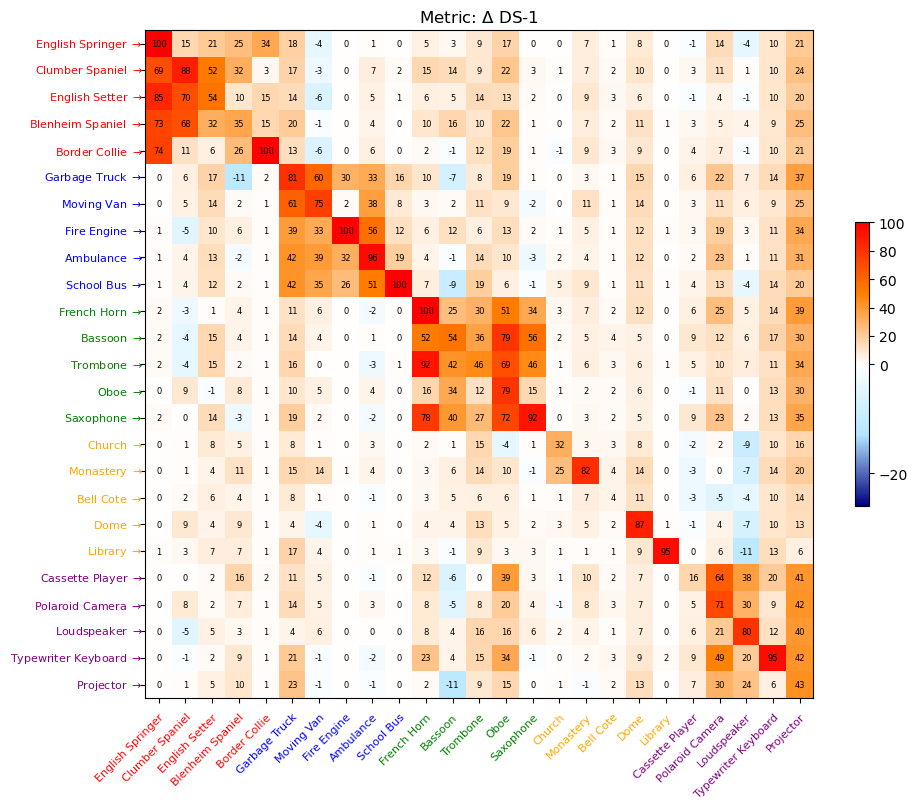

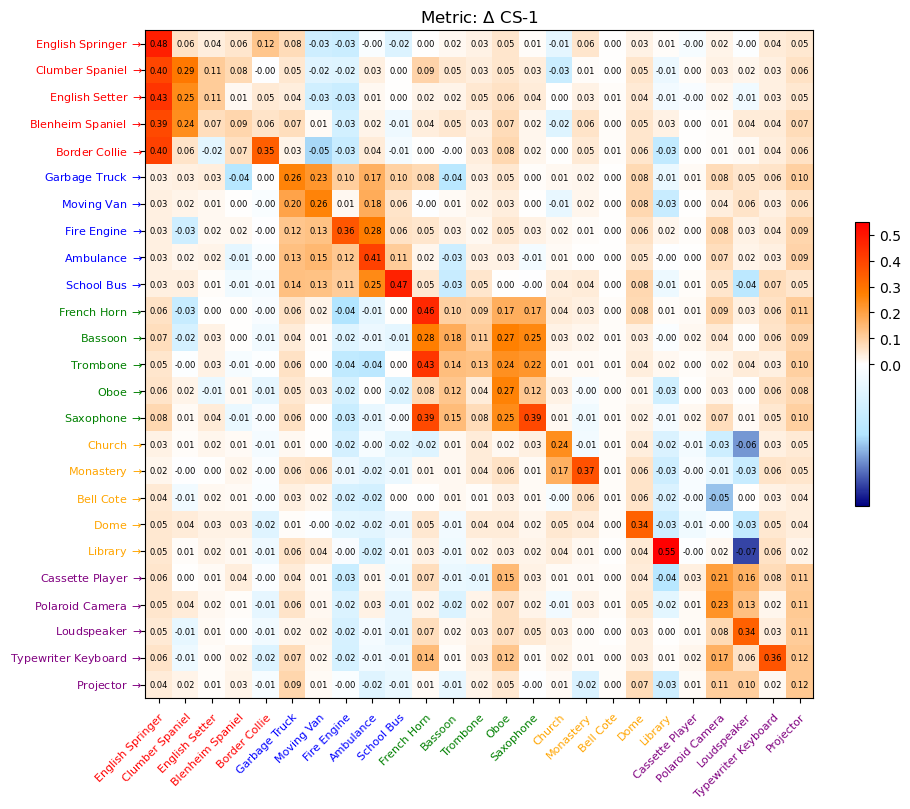

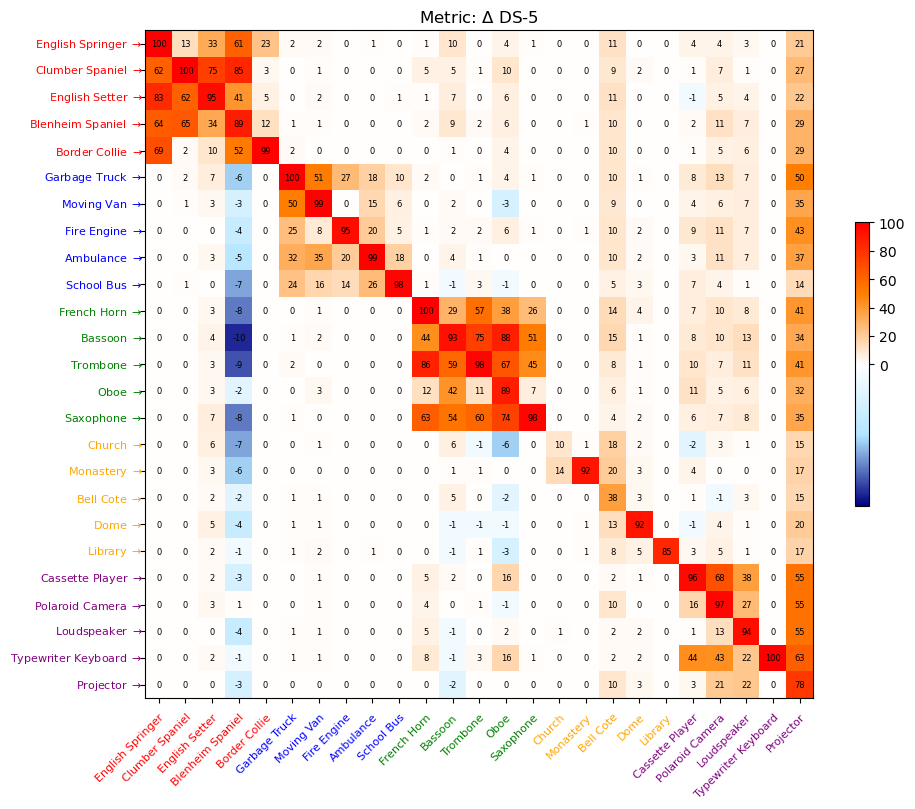

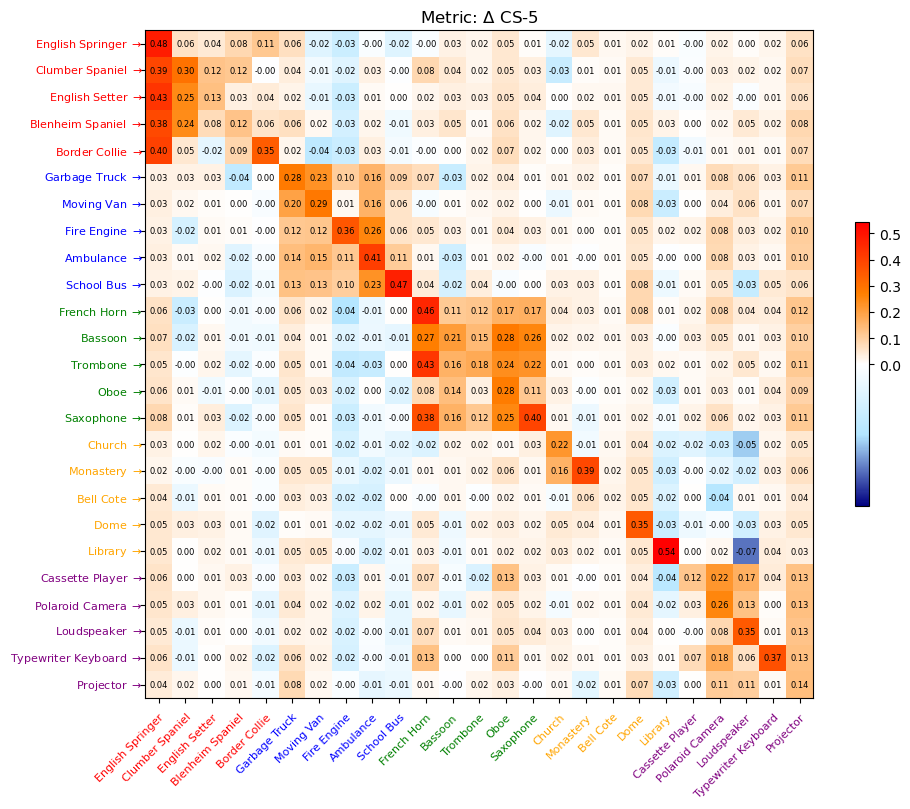

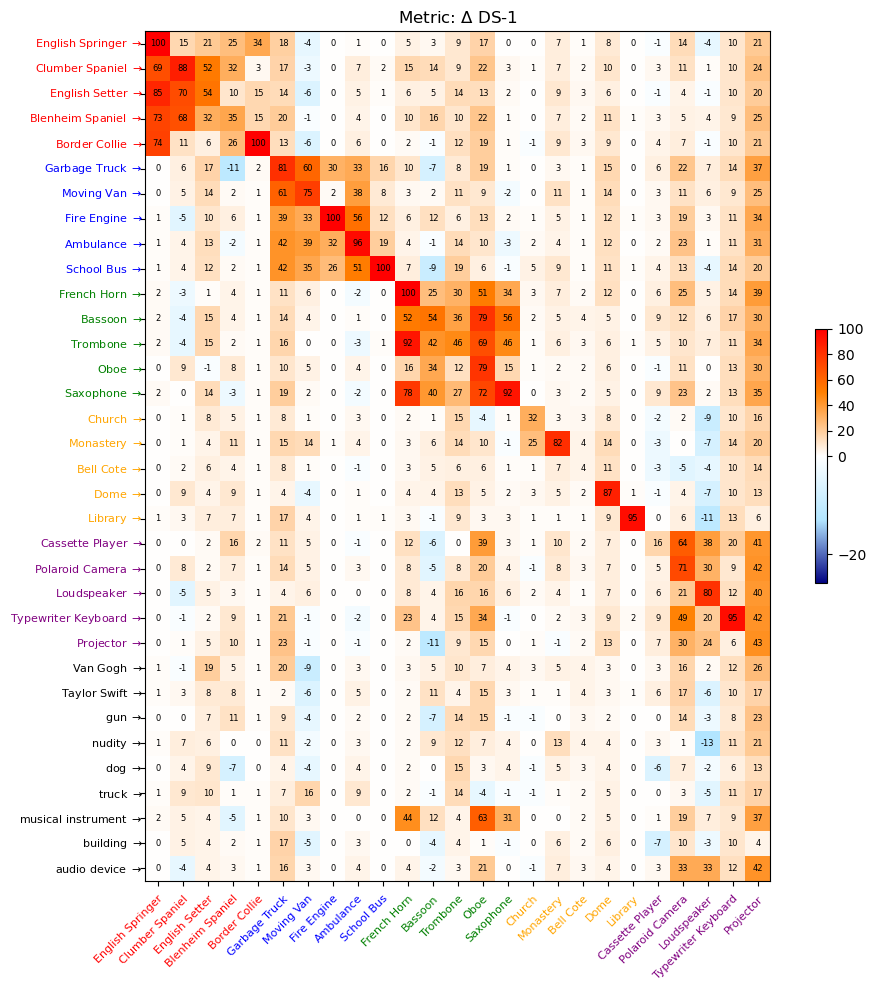

...

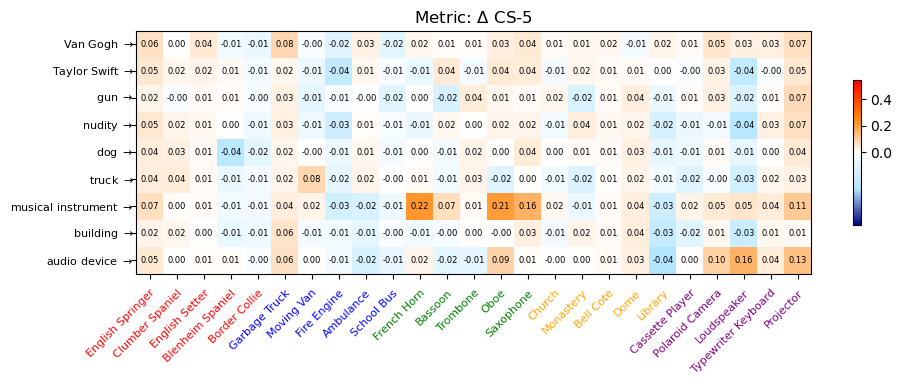

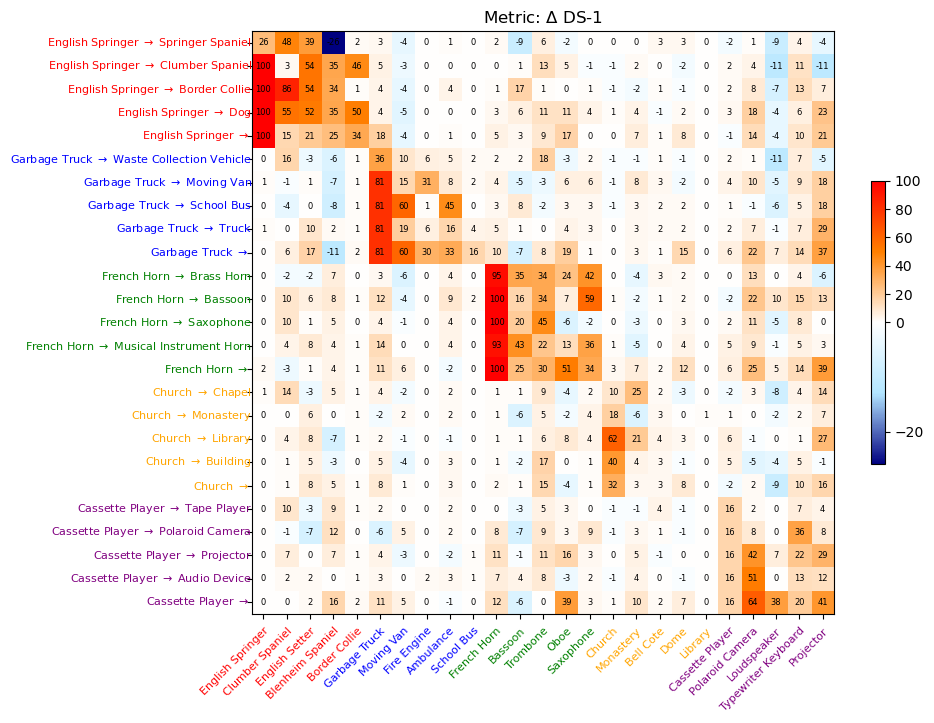

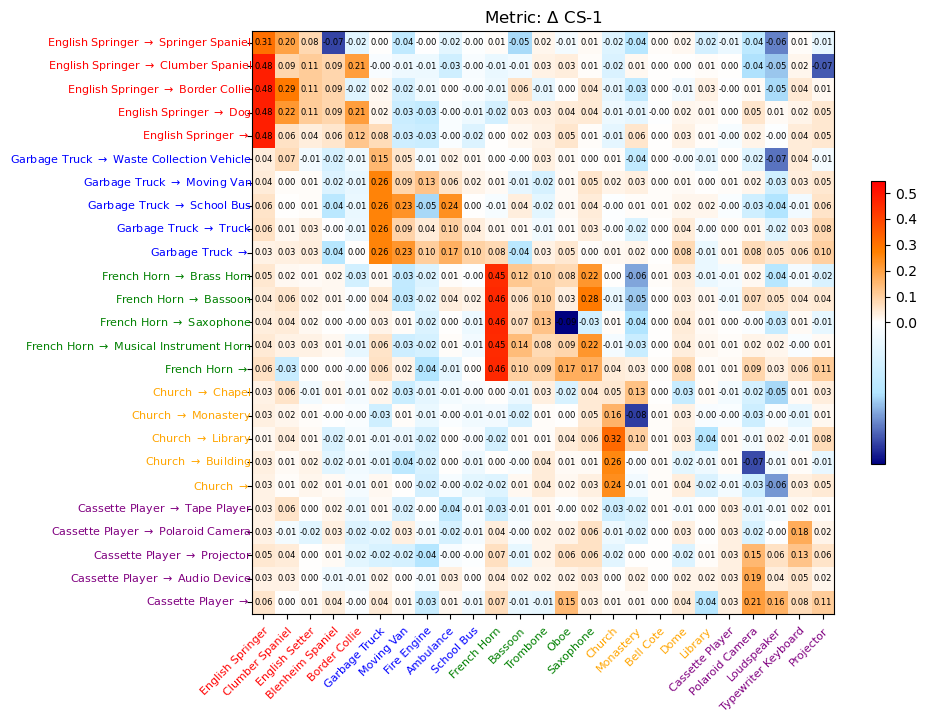

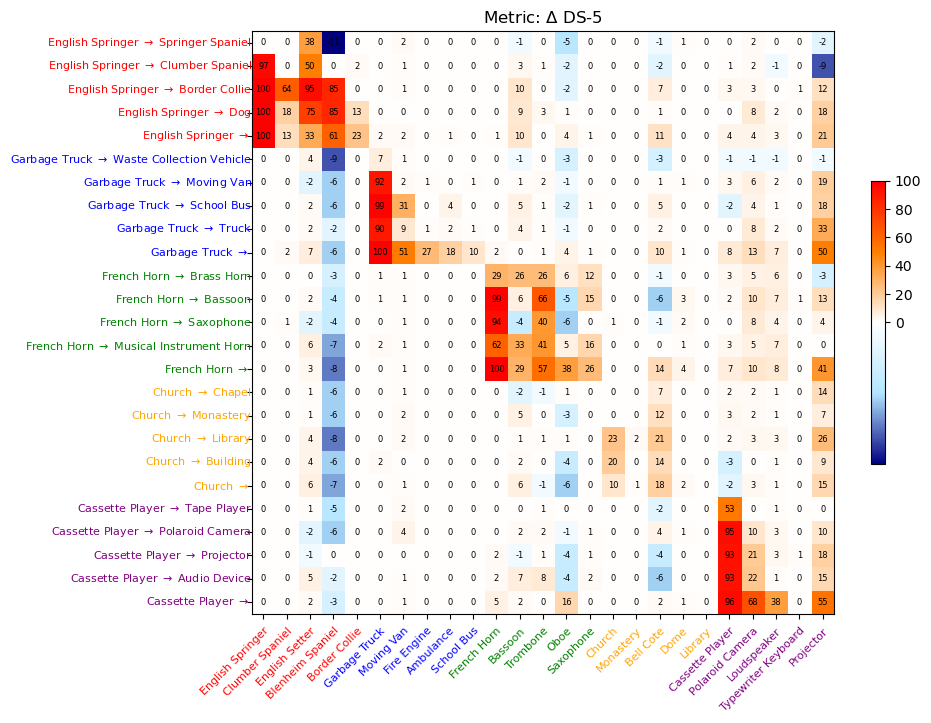

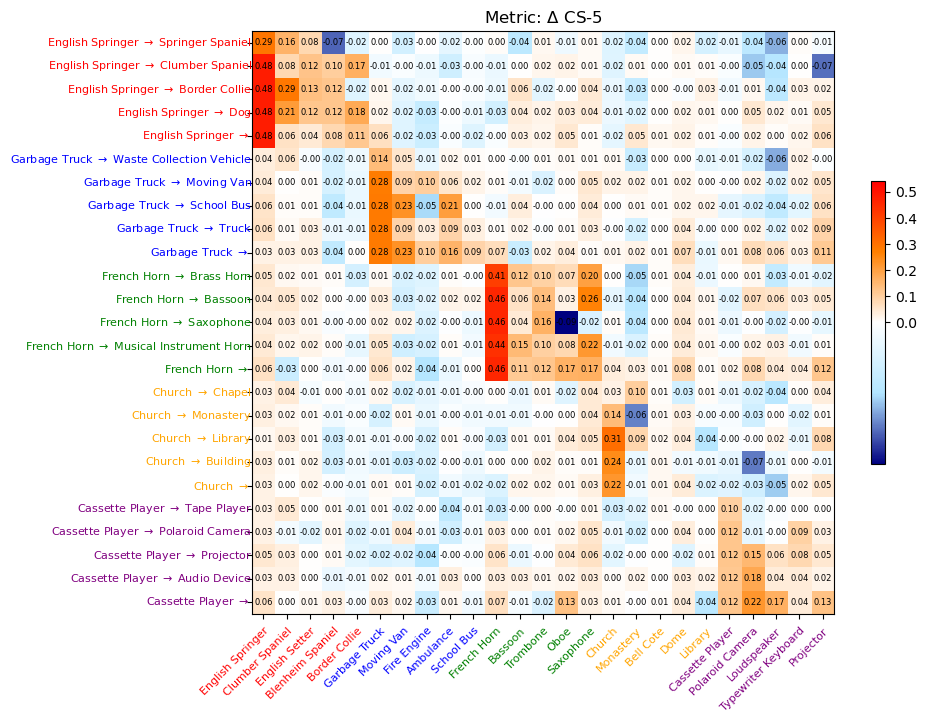

In [21]:
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.colors import LinearSegmentedColormap, TwoSlopeNorm

# Define custom colormaps for positive (orange to red) and negative (light blue to dark blue) values
colors_positive = [(1, 0.5, 0), (1, 0, 0)]  # Orange to Red
colors_negative = [(0.7, 0.9, 1), (0, 0, 0.5)]  # Light Blue to Dark Blue

cmap_positive = LinearSegmentedColormap.from_list("positive_cmap", colors_positive)
cmap_negative = LinearSegmentedColormap.from_list("negative_cmap", colors_negative)

# Combine the two colormaps into one, with a midpoint at 0
cmap = LinearSegmentedColormap.from_list(
    "combined_cmap",
    colors_negative[::-1] + [(1, 1, 1)] + colors_positive,  # Reverse negative colors, white for zero
    N=256
)

show_number = True
print('------------------------------------')
print('SD')
print('top1:', SD_corrects)
print('top5:', SD_corrects_5)
print('scores', SD_scores)
print('scores_5', SD_scores_5)

grids_data = {

}

for exp in jobs:

    grids = {
        'delta_top1': [],
        'delta_top5': [],
        'delta_scores': [],
        'delta_scores_5': []
    }

    for k, vv in jobs[exp].items():
        for v in vv:
            print('------------------------------------')
            print(f'Experiment: {exp}, Erased: {k}, Target: {v}')

            erased_classes = [k.lower()]
            preseved_classes = all_classes.copy()
            if k in preseved_classes:
                preseved_classes.remove(k)
            preseved_classes = [x.lower() for x in preseved_classes]

            esr_1_index, esr_5_index, psr_1_index, psr_5_index = cal_acc_index(results[exp][k][v], erased_classes, preseved_classes)
            count_corrects, count_corrects_5, scores, scores_5, _ = count_correct(results[exp][k][v], all_classes_index)


            # print(f'ESR-1: {esr_1_index}, ESR-5: {esr_5_index}, PSR-1: {psr_1_index}, PSR-5: {psr_5_index}')
            # print('top1:', count_corrects)
            # print('top5:', count_corrects_5)
            # print('scores', scores)
            # print('scores_5', scores_5)

            delta_top1 = [SD_corrects[k] - count_corrects[k] for k in count_corrects]
            delta_top5 = [SD_corrects_5[k] - count_corrects_5[k] for k in count_corrects_5]
            delta_scores = [SD_scores[k] - scores[k] for k in scores]
            delta_scores_5 = [SD_scores_5[k] - scores_5[k] for k in scores_5]

            grids['delta_top1'].append(np.expand_dims(np.asarray(delta_top1), axis=0))
            grids['delta_top5'].append(np.expand_dims(np.asarray(delta_top5), axis=0))
            grids['delta_scores'].append(np.expand_dims(np.asarray(delta_scores), axis=0))
            grids['delta_scores_5'].append(np.expand_dims(np.asarray(delta_scores_5), axis=0))
    

    # concatenate all delta_top1, delta_scores
    delta_top1 = np.concatenate(grids['delta_top1'], axis=0)
    delta_top5 = np.concatenate(grids['delta_top5'], axis=0)
    delta_scores = np.concatenate(grids['delta_scores'], axis=0)
    delta_scores_5 = np.concatenate(grids['delta_scores_5'], axis=0)


    print(exp, delta_top1.shape, delta_top5.shape, delta_scores.shape, delta_scores_5.shape)

    grids_data[exp] = {
        'delta_top1': delta_top1,
        'delta_top5': delta_top5,
        'delta_scores': delta_scores,
        'delta_scores_5': delta_scores_5
    }



gap_data = {

}

fixed_exp = 'target_empty'
fixed_target = ''
fixed_jobs = ['target_specific']


for exp in fixed_jobs:

    grids = {
        'delta_top1': [],
        'delta_top5': [],
        'delta_scores': [],
        'delta_scores_5': []
    }

    for k, vv in jobs[exp].items():
        for v in vv:
            print('------------------------------------')
            print(f'Experiment: {exp}, Erased: {k}, Target: {v}')

            erased_classes = [k.lower()]
            preseved_classes = all_classes.copy()
            preseved_classes.remove(k)
            preseved_classes = [x.lower() for x in preseved_classes]

            esr_1_index, esr_5_index, psr_1_index, psr_5_index = cal_acc_index(results[exp][k][v], erased_classes, preseved_classes)
            count_corrects, count_corrects_5, scores, scores_5, _ = count_correct(results[exp][k][v], all_classes_index)

            # get delta_top1, delta_top5, delta_scores, delta_scores_5 from fixed_exp, fixed_target
            fixed_esr_1_index, fixed_esr_5_index, fixed_psr_1_index, fixed_psr_5_index = cal_acc_index(results[fixed_exp][k][fixed_target], erased_classes, preseved_classes)
            fixed_count_corrects, fixed_count_corrects_5, fixed_scores, fixed_scores_5, _ = count_correct(results[fixed_exp][k][fixed_target], all_classes_index)

            delta_top1 = [fixed_count_corrects[k] - count_corrects[k] for k in count_corrects]
            delta_top5 = [fixed_count_corrects_5[k] - count_corrects_5[k] for k in count_corrects_5]
            delta_scores = [fixed_scores[k] - scores[k] for k in scores]
            delta_scores_5 = [fixed_scores_5[k] - scores_5[k] for k in scores_5]

            grids['delta_top1'].append(np.expand_dims(np.asarray(delta_top1), axis=0))
            grids['delta_top5'].append(np.expand_dims(np.asarray(delta_top5), axis=0))
            grids['delta_scores'].append(np.expand_dims(np.asarray(delta_scores), axis=0))
            grids['delta_scores_5'].append(np.expand_dims(np.asarray(delta_scores_5), axis=0))
    

    # concatenate all delta_top1, delta_scores
    delta_top1 = np.concatenate(grids['delta_top1'], axis=0)
    delta_top5 = np.concatenate(grids['delta_top5'], axis=0)
    delta_scores = np.concatenate(grids['delta_scores'], axis=0)
    delta_scores_5 = np.concatenate(grids['delta_scores_5'], axis=0)


    print(exp, delta_top1.shape, delta_top5.shape, delta_scores.shape, delta_scores_5.shape)

    gap_data[exp] = {
        'delta_top1': delta_top1,
        'delta_top5': delta_top5,
        'delta_scores': delta_scores,
        'delta_scores_5': delta_scores_5
    }

for exp in jobs:
    num_jobs = 2

    # Combine all delta_top5, delta_scores_5 into one image
    # fig, axs = plt.subplots(2, 1, figsize=(10, 10 * 2))

    # for i, key in enumerate(['delta_top5', 'delta_scores_5']):
    #     # Calculate global min and max across all jobs for the current key
    #     global_min = min(np.min(grids_data[_exp][key]) for _exp in jobs)
    #     global_max = max(np.max(grids_data[_exp][key]) for _exp in jobs)

    #     ax = axs[i] if num_jobs > 1 else axs
    #     data = grids_data[exp][key]

    #     # Normalize the colormap to have 0 as the center
    #     norm = TwoSlopeNorm(vmin=global_min, vcenter=0, vmax=global_max)

    #     # Apply the custom colormap
    #     im = ax.imshow(data, cmap=cmap, norm=norm, interpolation='nearest')

    #     # # Apply the global color range to all heatmaps
    #     # im = ax.imshow(data, cmap='coolwarm', interpolation='nearest', vmin=global_min, vmax=global_max)
        
    #     if data.shape[0] <= 5:
    #         plt.colorbar(im, ax=ax, shrink=0.05)
    #     elif data.shape[0] <= 10:
    #         plt.colorbar(im, ax=ax, shrink=0.15)
    #     else:
    #         plt.colorbar(im, ax=ax, shrink=0.3)

    #     # ax.set_title(f'{convert_label(exp)} ---- Metric: {convert_label(key)}')
    #     ax.set_title(f'Metric: {convert_label(key)}')
    #     ax.set_yticks(np.arange(len(convert_label_map(jobs[exp]))))
    #     ax.set_yticklabels(convert_label_map(jobs[exp]), fontsize=8)

    #     if i == num_jobs - 1:
    #         ax.set_xticks(np.arange(len(all_classes)))
    #         ax.set_xticklabels(all_classes, fontsize=8)
    #         plt.setp(ax.get_xticklabels(), rotation=45, ha='right', rotation_mode='anchor')
    
    # # Adjust the spacing between the heatmaps
    # if data.shape[0] <= 5:
    #     plt.subplots_adjust(hspace=-1.1)
    # elif data.shape[0] <= 10:
    #     plt.subplots_adjust(hspace=-1.1)
    # else:
    #     plt.subplots_adjust(hspace=-0.7)

    # fig.tight_layout()
    # plt.savefig(f'results/netfive/heatmap_top5_{exp}_{data.shape[0]}.png', dpi=300, bbox_inches='tight')

for exp in jobs:
    # Single image for each experiment
    for i, key in enumerate(['delta_top1', 'delta_scores', 'delta_top5', 'delta_scores_5']):
        # Calculate global min and max across all jobs for the current key
        global_min = min(np.min(grids_data[_exp][key]) for _exp in jobs)
        global_max = max(np.max(grids_data[_exp][key]) for _exp in jobs)

        fig, ax = plt.subplots(1, 1, figsize=(10, 10))
        data = grids_data[exp][key]

        # Normalize the colormap to have 0 as the center
        norm = TwoSlopeNorm(vmin=global_min, vcenter=0, vmax=global_max)

        # Apply the custom colormap
        im = ax.imshow(data, cmap=cmap, norm=norm, interpolation='nearest')

        if data.shape[0] <= 5:
            plt.colorbar(im, ax=ax, shrink=0.05)
        elif data.shape[0] <= 10:
            plt.colorbar(im, ax=ax, shrink=0.15)
        else:
            plt.colorbar(im, ax=ax, shrink=0.3)

        ax.set_title(f'Metric: {convert_label(key)}')
        ax.set_yticks(np.arange(len(convert_label_map(jobs[exp]))))
        
        # Set y-axis labels with different colors
        ylabels = convert_label_map(jobs[exp])
        for idx, label in enumerate(ylabels):
            color = assign_color(label)
            ax.text(-0.5, idx, label, ha='right', va='center', fontsize=8, color=color)
        ax.set_yticklabels([])  # Remove the default y-axis labels

        ax.set_xticks(np.arange(len(all_classes)))
        xlabels = all_classes
        for idx, label in enumerate(xlabels):
            color = assign_color(label)
            ax.text(idx, len(ylabels), label, ha='right', va='top', fontsize=8, color=color, rotation=45, rotation_mode='anchor')
        ax.set_xticklabels([])  # Remove the default x-axis labels

        # Display number in each cell of the grid
        if show_number:
            if key in ['delta_top1', 'delta_top5']:
                for (j,i),value in np.ndenumerate(data):
                    ax.text(i, j, f'{value}', ha='center', va='center', fontsize=6)
            else:
                for (j,i),value in np.ndenumerate(data):
                    ax.text(i, j, f'{value:.2f}', ha='center', va='center', fontsize=6)

        # Adjust the spacing between the heatmaps
        plt.subplots_adjust(hspace=-1.1)

        fig.tight_layout()
        plt.savefig(f'results/netfive/heatmap_top5_{exp}_{key}_{data.shape[0]}.png', dpi=300, bbox_inches='tight')


# for exp in jobs:
#     num_jobs = 2

#     fig, axs = plt.subplots(2, 1, figsize=(10, 10 * 2))

#     for i, key in enumerate(['delta_top1', 'delta_scores']):
#         # Calculate global min and max across all jobs for the current key
#         global_min = min(np.min(grids_data[_exp][key]) for _exp in jobs)
#         global_max = max(np.max(grids_data[_exp][key]) for _exp in jobs)

#         ax = axs[i] if num_jobs > 1 else axs
#         data = grids_data[exp][key]

#         # Apply the global color range to all heatmaps
#         im = ax.imshow(data, cmap='coolwarm', interpolation='nearest', vmin=global_min, vmax=global_max)

#         if data.shape[0] <= 5:
#             plt.colorbar(im, ax=ax, shrink=0.05)
#         elif data.shape[0] <= 10:
#             plt.colorbar(im, ax=ax, shrink=0.15)
#         else:
#             plt.colorbar(im, ax=ax, shrink=0.3)


#         # ax.set_title(f'{convert_label(exp)} ---- Metric: {convert_label(key)}')
#         ax.set_title(f'Metric: {convert_label(key)}')
#         ax.set_yticks(np.arange(len(convert_label_map(jobs[exp]))))
#         ax.set_yticklabels(convert_label_map(jobs[exp]), fontsize=8)

#         if i == num_jobs - 1:
#             ax.set_xticks(np.arange(len(all_classes)))
#             ax.set_xticklabels(all_classes, fontsize=8)
#             plt.setp(ax.get_xticklabels(), rotation=45, ha='right', rotation_mode='anchor')
    
#     # Adjust the spacing between the heatmaps
#     if data.shape[0] <= 5:
#         plt.subplots_adjust(hspace=-1.1)
#     elif data.shape[0] <= 10:
#         plt.subplots_adjust(hspace=-1.1)
#     else:
#         plt.subplots_adjust(hspace=-0.7)

#     fig.tight_layout()
#     plt.savefig(f'results/netfive/heatmap_top1_{exp}_{data.shape[0]}.png', dpi=300, bbox_inches='tight')


------------------------------------
Experiment: target_specific, Erased: English Springer, Target: Springer Spaniel
------------------------------------
Experiment: target_specific, Erased: English Springer, Target: Clumber Spaniel
------------------------------------
Experiment: target_specific, Erased: English Springer, Target: Border Collie
------------------------------------
Experiment: target_specific, Erased: English Springer, Target: Dog
------------------------------------
Experiment: target_specific, Erased: English Springer, Target: 
------------------------------------
Experiment: target_specific, Erased: Garbage Truck, Target: Waste Collection Vehicle
------------------------------------
Experiment: target_specific, Erased: Garbage Truck, Target: Moving Van
------------------------------------
Experiment: target_specific, Erased: Garbage Truck, Target: School Bus
------------------------------------
Experiment: target_specific, Erased: Garbage Truck, Target: Truck
-------

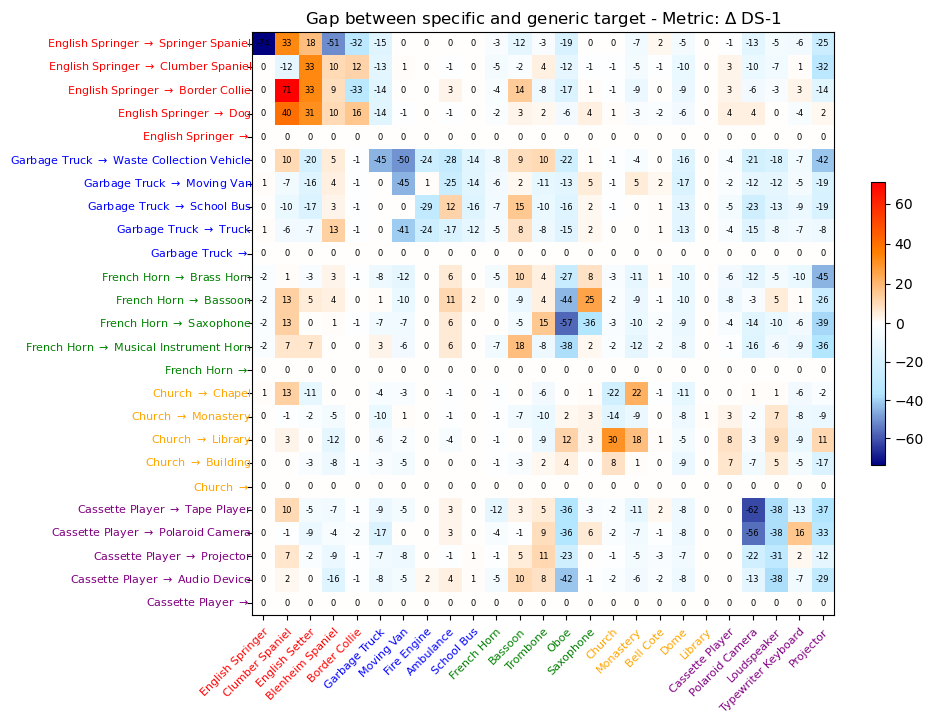

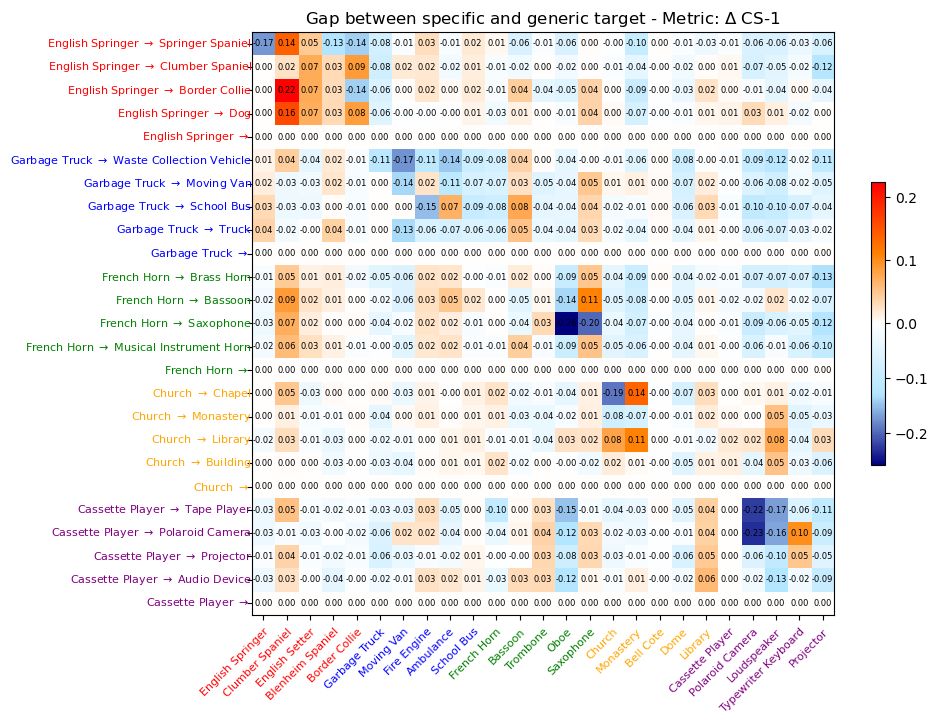

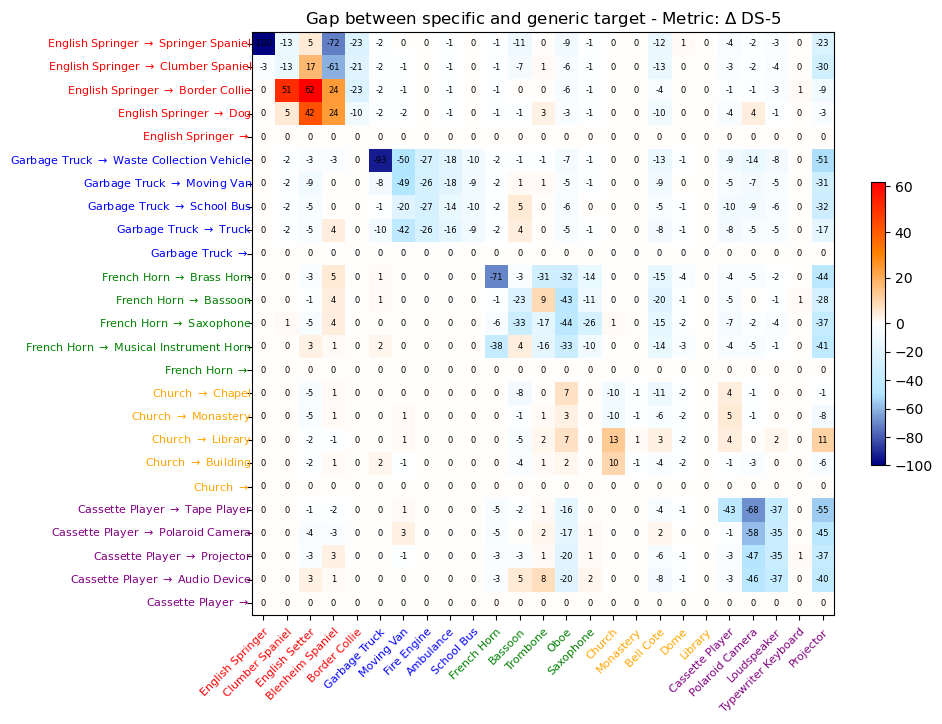

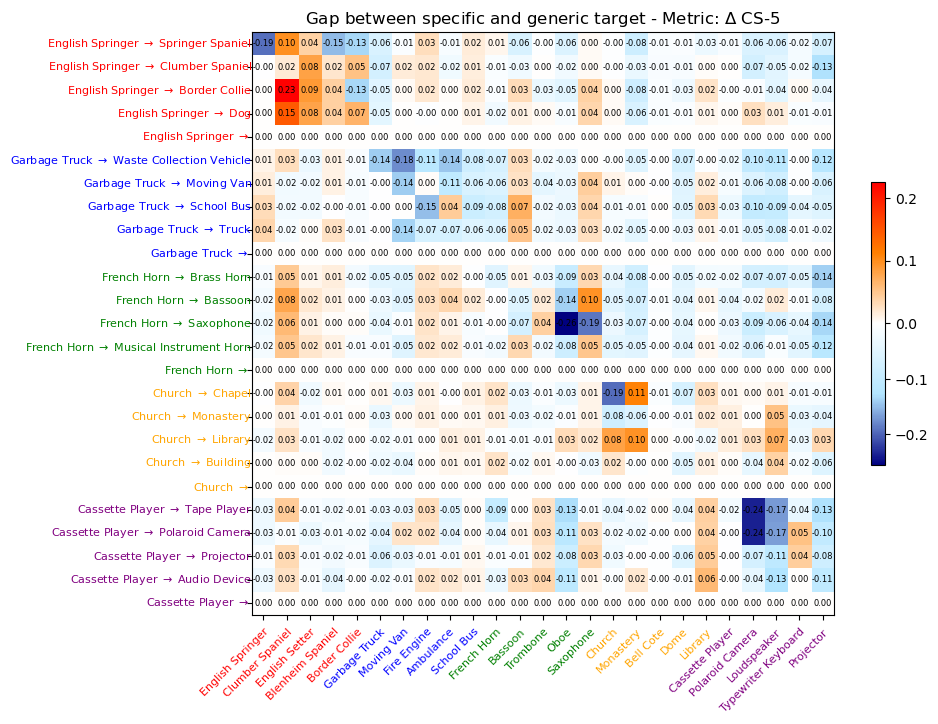

In [22]:

gap_data = {

}

fixed_exp = 'target_empty'
fixed_target = ''
fixed_jobs = ['target_specific']


for exp in fixed_jobs:

    grids = {
        'delta_top1': [],
        'delta_top5': [],
        'delta_scores': [],
        'delta_scores_5': []
    }

    for k, vv in jobs[exp].items():
        for v in vv:
            print('------------------------------------')
            print(f'Experiment: {exp}, Erased: {k}, Target: {v}')

            erased_classes = [k.lower()]
            preseved_classes = all_classes.copy()
            preseved_classes.remove(k)
            preseved_classes = [x.lower() for x in preseved_classes]

            esr_1_index, esr_5_index, psr_1_index, psr_5_index = cal_acc_index(results[exp][k][v], erased_classes, preseved_classes)
            count_corrects, count_corrects_5, scores, scores_5, _ = count_correct(results[exp][k][v], all_classes_index)

            # get delta_top1, delta_top5, delta_scores, delta_scores_5 from fixed_exp, fixed_target
            fixed_esr_1_index, fixed_esr_5_index, fixed_psr_1_index, fixed_psr_5_index = cal_acc_index(results[fixed_exp][k][fixed_target], erased_classes, preseved_classes)
            fixed_count_corrects, fixed_count_corrects_5, fixed_scores, fixed_scores_5, _ = count_correct(results[fixed_exp][k][fixed_target], all_classes_index)

            delta_top1 = [fixed_count_corrects[k] - count_corrects[k] for k in count_corrects]
            delta_top5 = [fixed_count_corrects_5[k] - count_corrects_5[k] for k in count_corrects_5]
            delta_scores = [fixed_scores[k] - scores[k] for k in scores]
            delta_scores_5 = [fixed_scores_5[k] - scores_5[k] for k in scores_5]

            grids['delta_top1'].append(np.expand_dims(np.asarray(delta_top1), axis=0))
            grids['delta_top5'].append(np.expand_dims(np.asarray(delta_top5), axis=0))
            grids['delta_scores'].append(np.expand_dims(np.asarray(delta_scores), axis=0))
            grids['delta_scores_5'].append(np.expand_dims(np.asarray(delta_scores_5), axis=0))
    

    # concatenate all delta_top1, delta_scores
    delta_top1 = np.concatenate(grids['delta_top1'], axis=0)
    delta_top5 = np.concatenate(grids['delta_top5'], axis=0)
    delta_scores = np.concatenate(grids['delta_scores'], axis=0)
    delta_scores_5 = np.concatenate(grids['delta_scores_5'], axis=0)


    print(exp, delta_top1.shape, delta_top5.shape, delta_scores.shape, delta_scores_5.shape)

    gap_data[exp] = {
        'delta_top1': delta_top1,
        'delta_top5': delta_top5,
        'delta_scores': delta_scores,
        'delta_scores_5': delta_scores_5
    }


for exp in fixed_jobs:
    # Single image for each experiment
    for i, key in enumerate(['delta_top1', 'delta_scores', 'delta_top5', 'delta_scores_5']):
        # Calculate global min and max across all jobs for the current key
        global_min = min(np.min(gap_data[_exp][key]) for _exp in fixed_jobs)
        global_max = max(np.max(gap_data[_exp][key]) for _exp in fixed_jobs)

        fig, ax = plt.subplots(1, 1, figsize=(10, 10))
        data = gap_data[exp][key]

        # Normalize the colormap to have 0 as the center
        norm = TwoSlopeNorm(vmin=global_min, vcenter=0, vmax=global_max)

        # Apply the custom colormap
        im = ax.imshow(data, cmap=cmap, norm=norm, interpolation='nearest')

        if data.shape[0] <= 5:
            plt.colorbar(im, ax=ax, shrink=0.05)
        elif data.shape[0] <= 10:
            plt.colorbar(im, ax=ax, shrink=0.15)
        else:
            plt.colorbar(im, ax=ax, shrink=0.3)

        ax.set_title(f'Gap between specific and generic target - Metric: {convert_label(key)}')
        ax.set_yticks(np.arange(len(convert_label_map(jobs[exp]))))
        
        # Set y-axis labels with different colors
        ylabels = convert_label_map(jobs[exp])
        for idx, label in enumerate(ylabels):
            color = assign_color(label)
            ax.text(-0.5, idx, label, ha='right', va='center', fontsize=8, color=color)
        ax.set_yticklabels([])  # Remove the default y-axis labels

        ax.set_xticks(np.arange(len(all_classes)))
        xlabels = all_classes
        for idx, label in enumerate(xlabels):
            color = assign_color(label)
            ax.text(idx, len(ylabels), label, ha='right', va='top', fontsize=8, color=color, rotation=45, rotation_mode='anchor')
        ax.set_xticklabels([])  # Remove the default x-axis labels
    
        # Display number in each cell of the grid
        if show_number:
            if key in ['delta_top1', 'delta_top5']:
                for (j,i),value in np.ndenumerate(data):
                    ax.text(i, j, f'{value}', ha='center', va='center', fontsize=6)
            else:
                for (j,i),value in np.ndenumerate(data):
                    ax.text(i, j, f'{value:.2f}', ha='center', va='center', fontsize=6)

        # Adjust the spacing between the heatmaps
        plt.subplots_adjust(hspace=-1.1)

        fig.tight_layout()
        plt.savefig(f'results/netfive/gap_heatmap_top5_{exp}_{key}_{data.shape[0]}.png', dpi=300, bbox_inches='tight')


Experiment: target_empty, Erased: English Springer, Target: 
ESR-1: 1.0, ESR-5: 1.0, PSR-1: 0.6620833333333334, PSR-5: 0.8691666666666666
top1: {'English Springer': 0, 'Clumber Spaniel': 73, 'English Setter': 33, 'Blenheim Spaniel': 10, 'Border Collie': 66, 'Garbage Truck': 63, 'Moving Van': 79, 'Fire Engine': 100, 'Ambulance': 95, 'School Bus': 100, 'French Horn': 95, 'Bassoon': 51, 'Trombone': 37, 'Oboe': 63, 'Saxophone': 94, 'Church': 99, 'Monastery': 77, 'Bell Cote': 3, 'Dome': 82, 'Library': 100, 'Cassette Player': 17, 'Polaroid Camera': 57, 'Loudspeaker': 88, 'Typewriter Keyboard': 85, 'Projector': 22}
top5: {'English Springer': 0, 'Clumber Spaniel': 87, 'English Setter': 62, 'Blenheim Spaniel': 28, 'Border Collie': 77, 'Garbage Truck': 98, 'Moving Van': 98, 'Fire Engine': 100, 'Ambulance': 99, 'School Bus': 100, 'French Horn': 99, 'Bassoon': 83, 'Trombone': 99, 'Oboe': 90, 'Saxophone': 99, 'Church': 100, 'Monastery': 100, 'Bell Cote': 29, 'Dome': 100, 'Library': 100, 'Cassette P

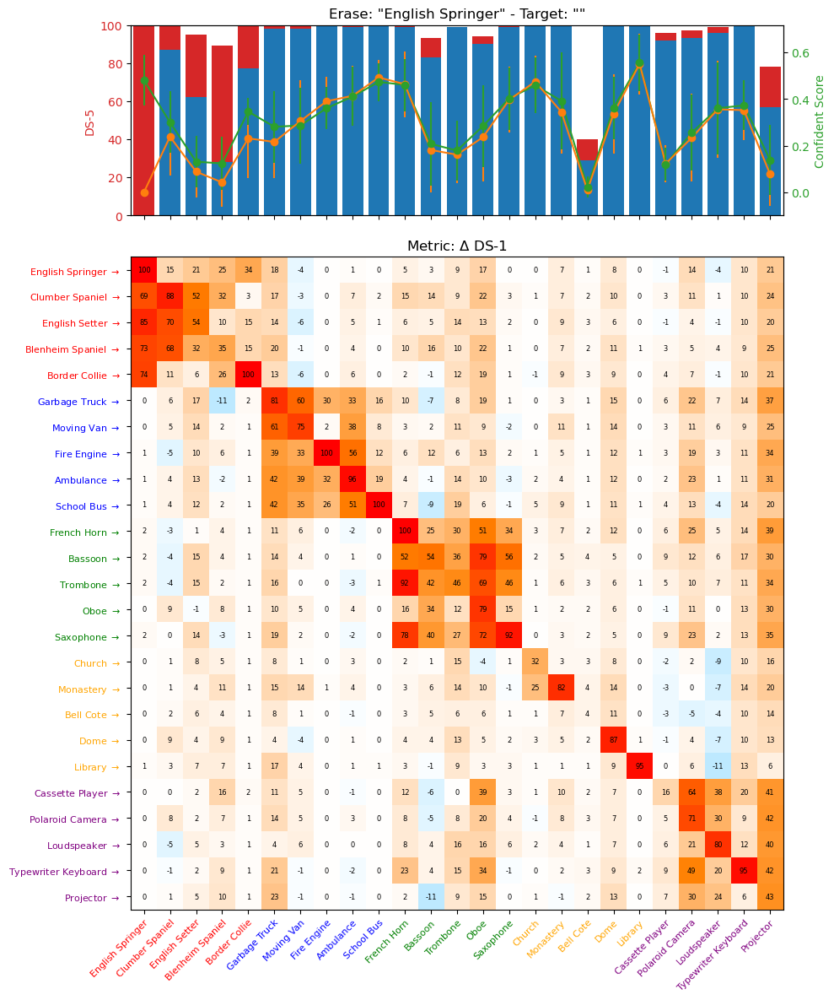

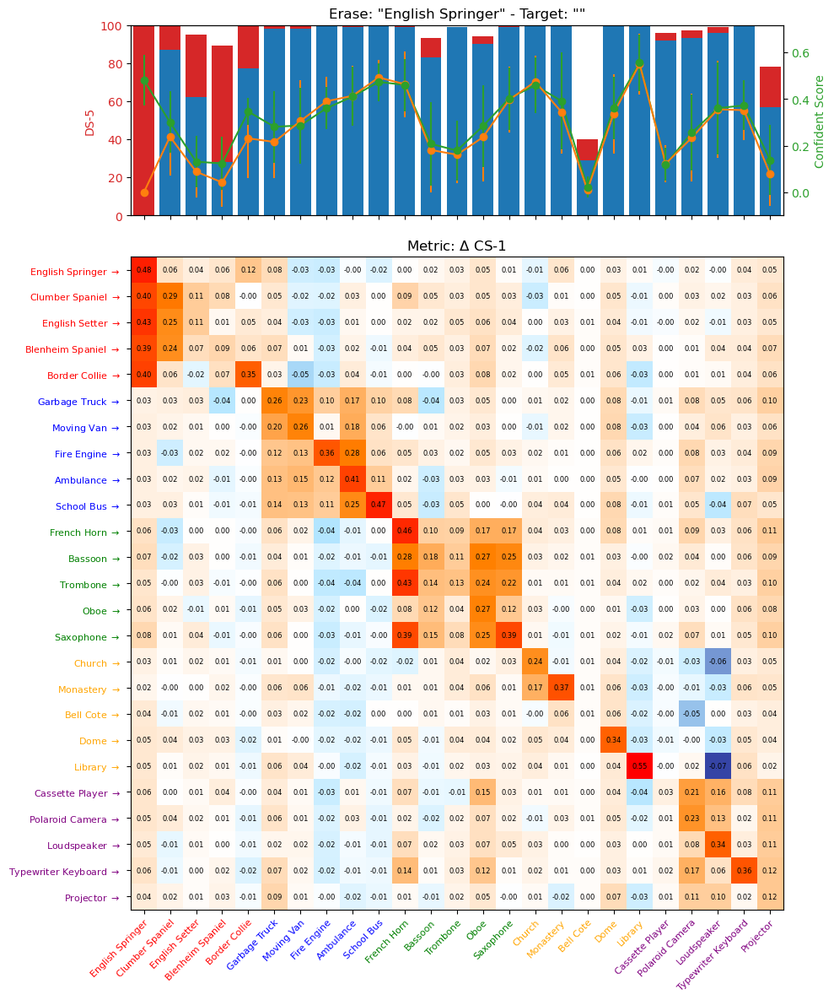

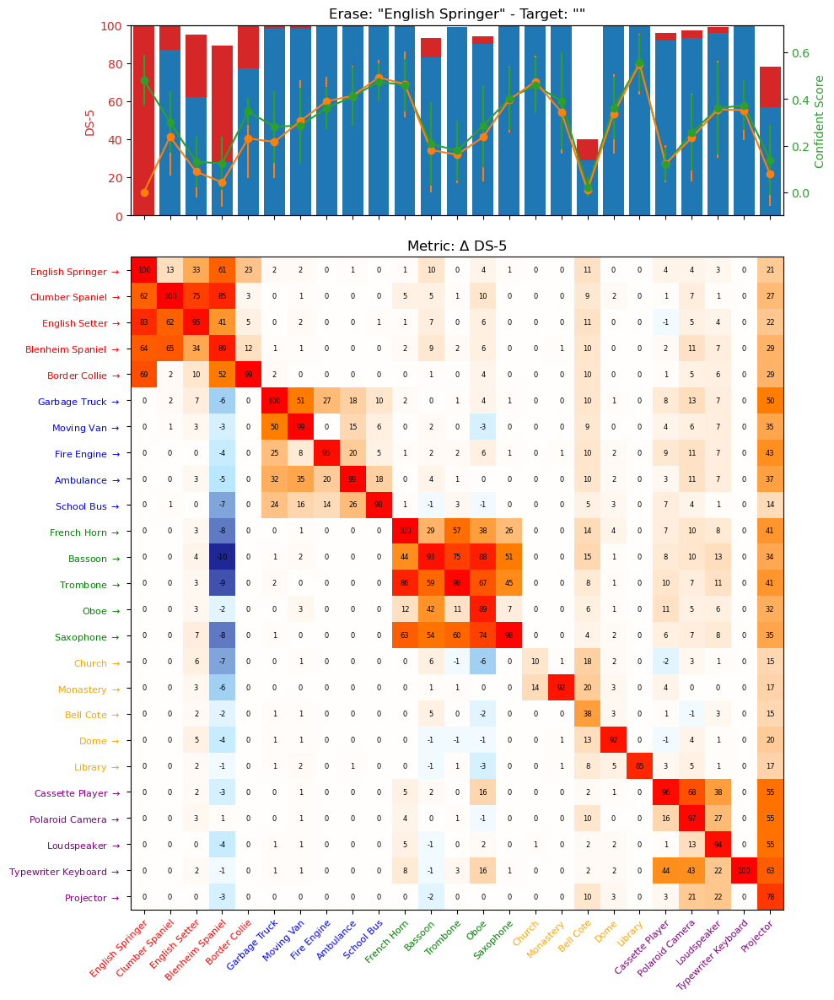

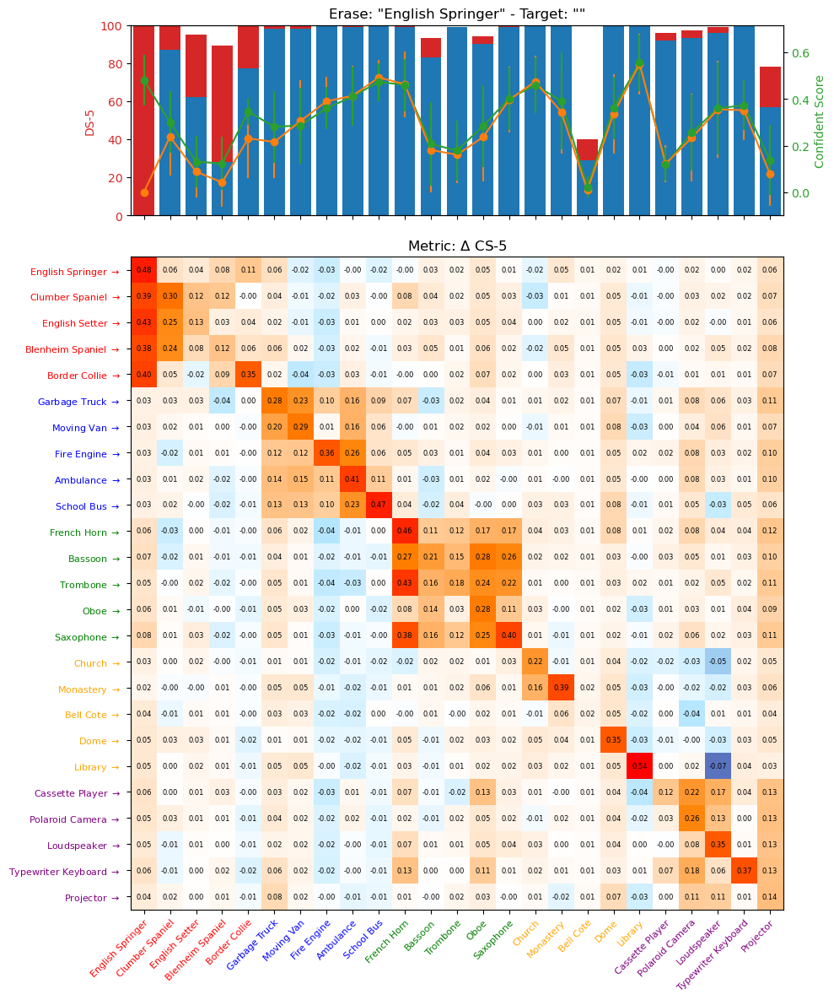

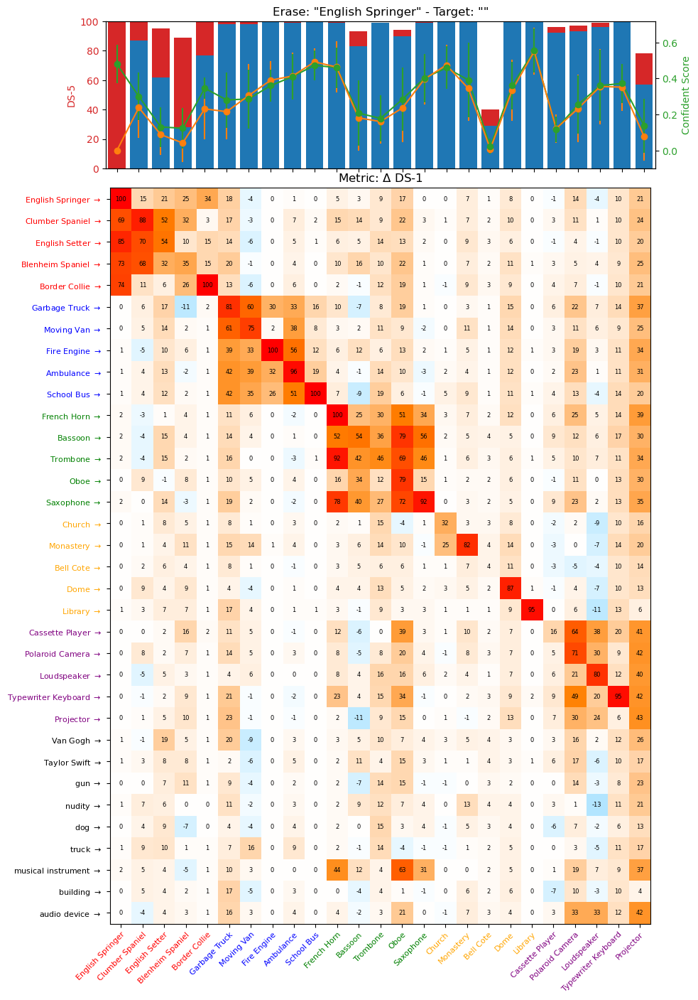

...

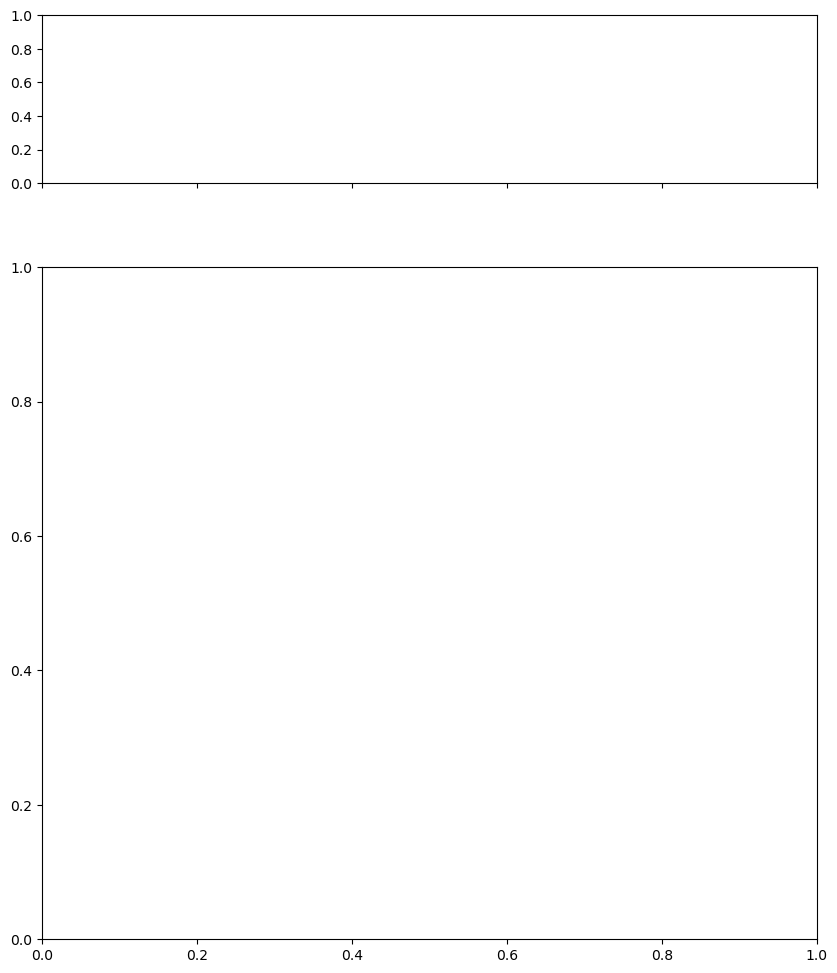

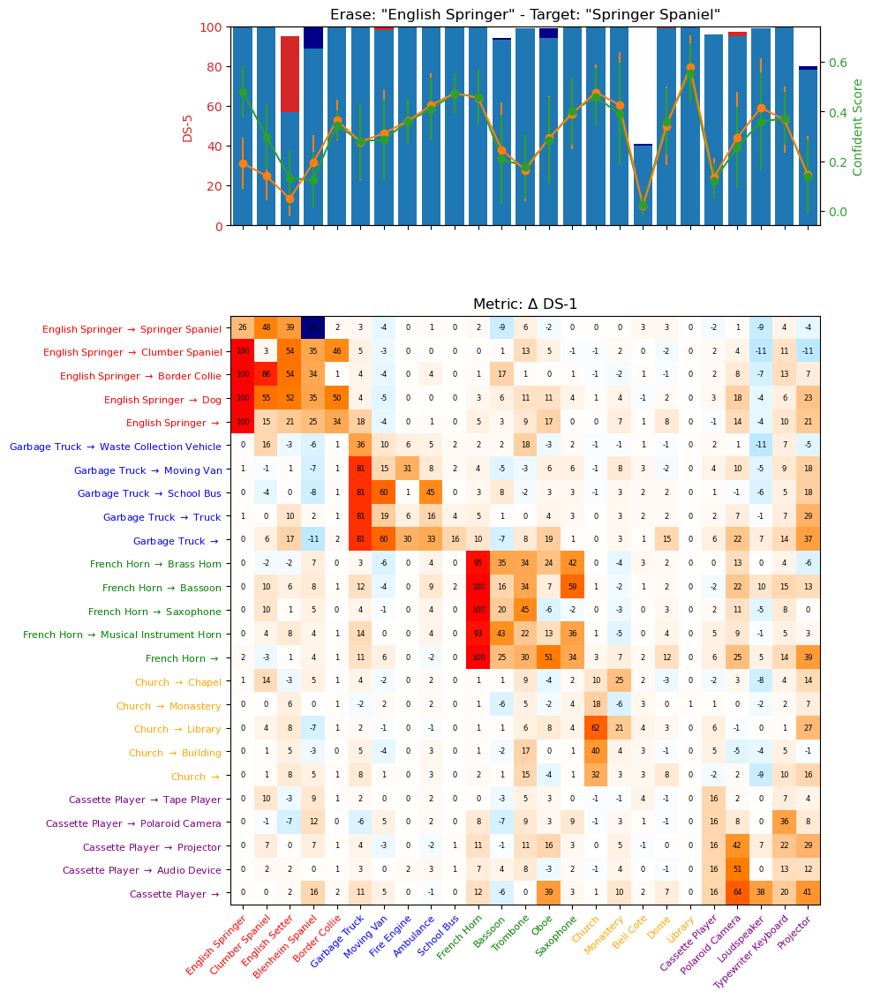

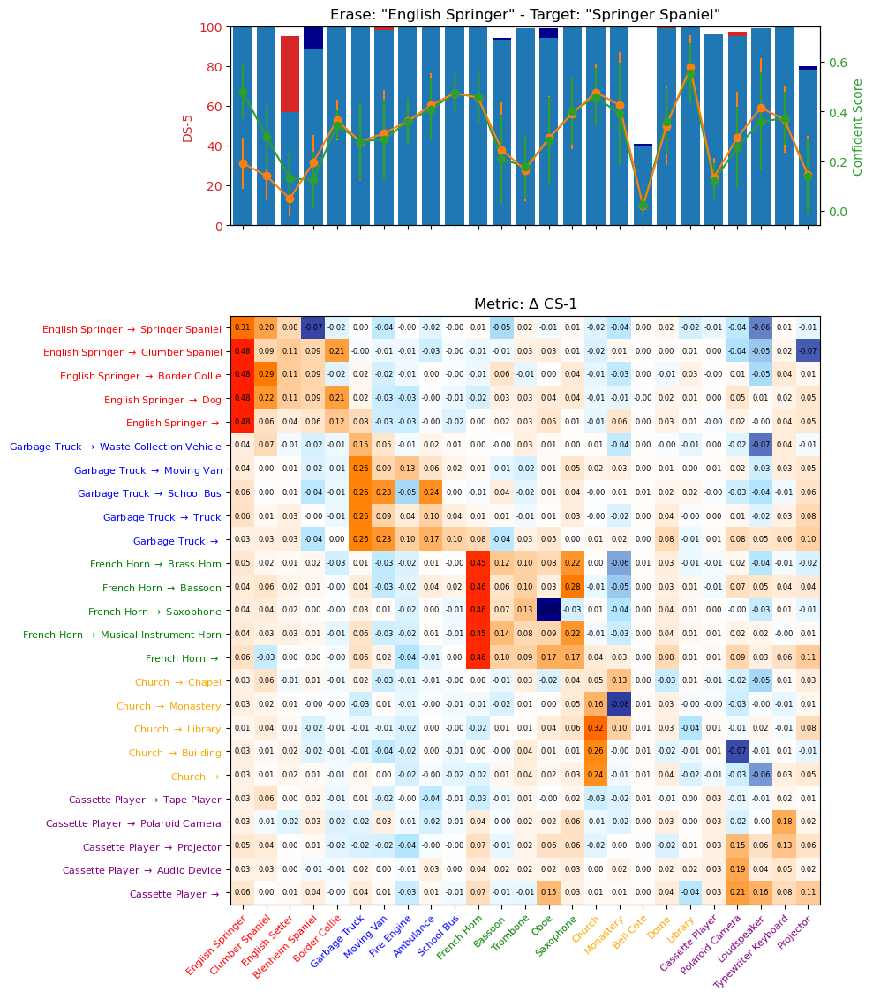

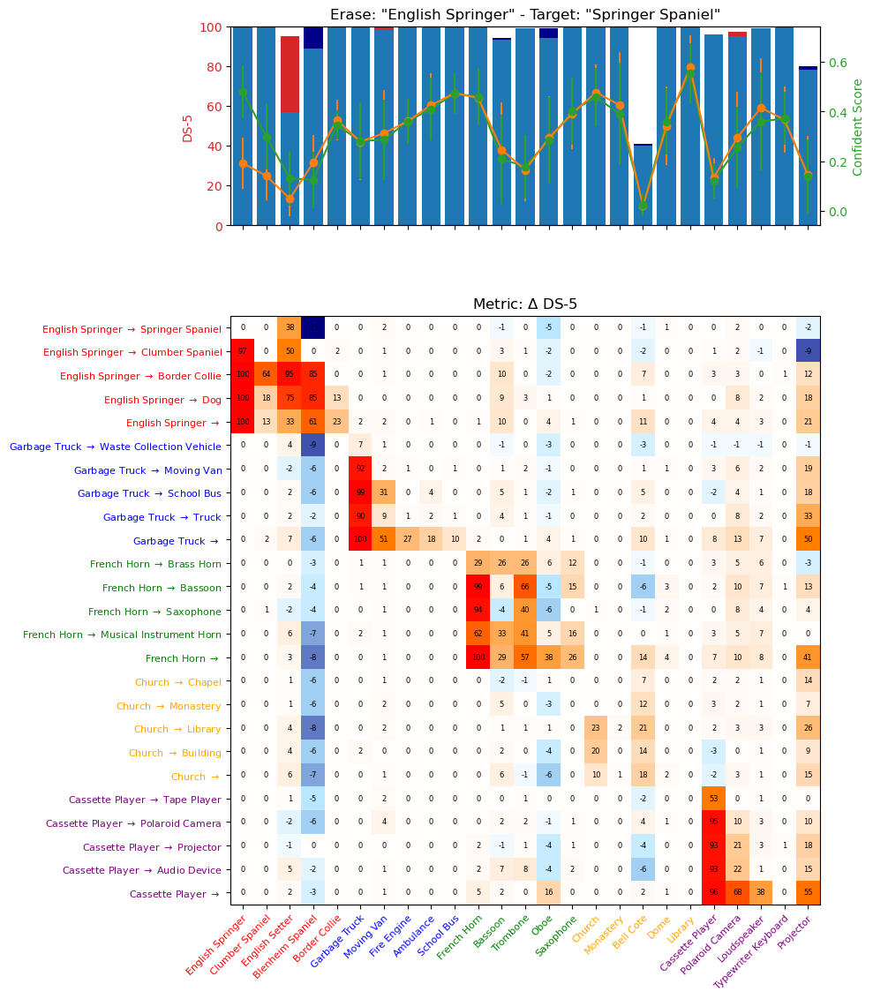

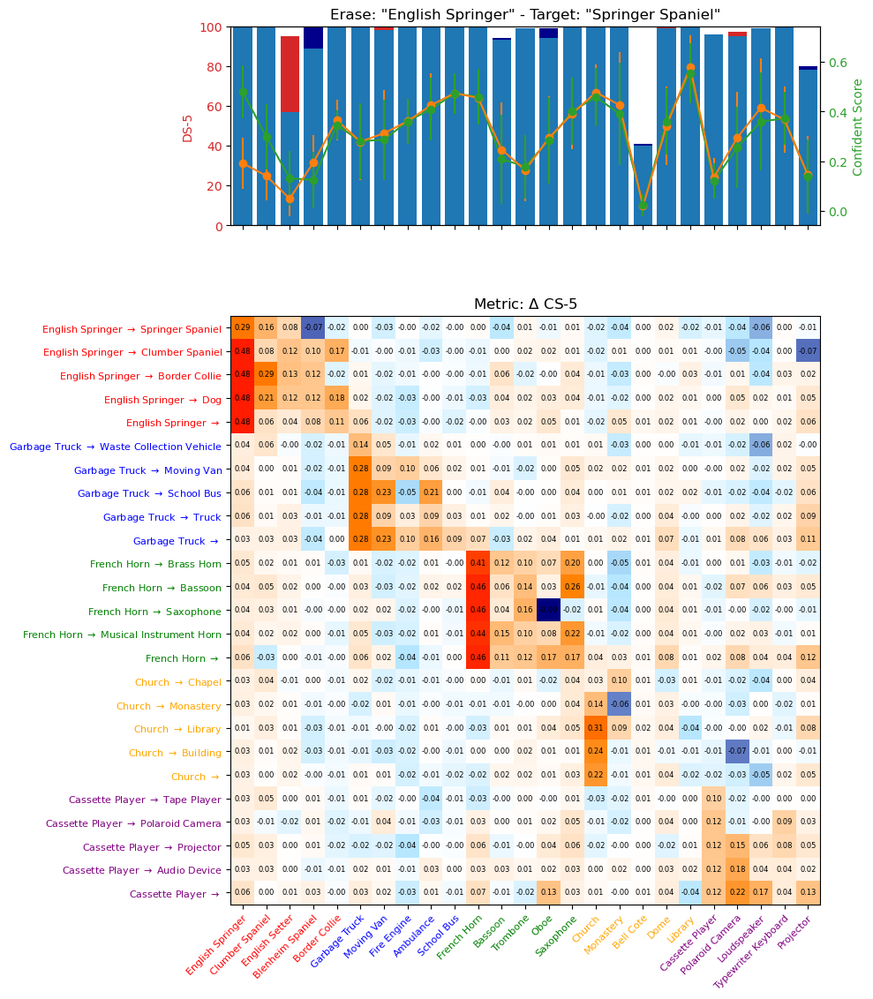

In [31]:
# Merge two images 
plot_error_bar = True 
plot_color_bar = False
error_bar_scale = 1 

for exp in jobs:
    for _, key in enumerate(['delta_top1', 'delta_scores', 'delta_top5', 'delta_scores_5']):
        num_jobs = 2

        if grids_data[exp][key].shape[0] <= 25:
            fig, axs = plt.subplots(nrows=2, sharex=True, figsize=(10,12), gridspec_kw={"height_ratios": [1,4]})
        else:
            fig, axs = plt.subplots(nrows=2, sharex=True, figsize=(10,14), gridspec_kw={"height_ratios": [1,5]})
        # ------------------------------------------------

        i = 0
        concept = 'English Springer'
        if concept not in jobs[exp]:
            continue
        target = list(jobs[exp][concept])[0]

        k = concept
        erased_classes = [k.lower()]
        preseved_classes = all_classes.copy()
        if k in preseved_classes:
            preseved_classes.remove(k)
        preseved_classes = [x.lower() for x in preseved_classes]

        esr_1_index, esr_5_index, psr_1_index, psr_5_index = cal_acc_index(results[exp][k][target], erased_classes, preseved_classes)
        count_corrects, count_corrects_5, scores, scores_5, _, sta_scores, sta_scores_5 = count_correct(results[exp][k][target], all_classes_index, return_sta=True)


        delta_top1 = {k: SD_corrects[k] - count_corrects[k] for k in count_corrects}
        delta_top5 = {k: SD_corrects_5[k] - count_corrects_5[k] for k in count_corrects_5}
        delta_scores = {k: SD_scores[k] - scores[k] for k in scores}
        delta_scores_5 = {k: SD_scores_5[k] - scores_5[k] for k in scores_5}

        classes = list(delta_top5.keys())
        SD_top5_values = list(SD_corrects_5.values())
        cur_top5_values = list(count_corrects_5.values())
        delta_top5_values = list(delta_top5.values())

        print(f'Experiment: {exp}, Erased: {k}, Target: {v}')
        print(f'ESR-1: {esr_1_index}, ESR-5: {esr_5_index}, PSR-1: {psr_1_index}, PSR-5: {psr_5_index}')
        print('top1:', count_corrects)
        print('top5:', count_corrects_5)
        print('scores', scores)
        print('scores_5', scores_5)
        print('sta_scores - mean', {k: v[0] for k, v in sta_scores.items()})
        print('sta_scores - std', {k: v[1] for k, v in sta_scores.items()})
        print('sta_scores_5 - mean', {k: v[0] for k, v in sta_scores_5.items()})
        print('sta_scores_5 - std', {k: v[1] for k, v in sta_scores_5.items()}) 
        
        # plot in this subplot a bar chart with two y-axis, one for delta_top1, one for delta_scores
        ax = axs[i] if num_jobs > 1 else axs
        color = 'tab:red'

        ax.set_ylabel(convert_label('DS-5'), color=color)
        ax.tick_params(axis='y', labelcolor=color)

        delta_colors = ['tab:red' if v > 0 else 'darkblue' for v in delta_top5_values]
        # bot_cur_top5_values = [x if d > 0 else x + d for x, d in zip(cur_top5_values, delta_top5_values)]
        bot_cur_top5_values = cur_top5_values

        ax.bar(classes, cur_top5_values, color='tab:blue', label=convert_label('cur_top5_values'))
        ax.bar(classes, delta_top5_values, color=delta_colors, label=convert_label('delta_scores_5'), bottom=bot_cur_top5_values)

        # Rotate x-axis labels and apply assign_color
        plt.xticks(rotation=45, ha='right', fontsize=8)
        for label in ax.get_xticklabels():
            label.set_color(assign_color(label.get_text()))

        ax2 = ax.twinx()
        color = 'tab:green'
        ax2.set_ylabel(convert_label('Confident Score'), color=color)
        ax2.plot(SD_scores_5.keys(), SD_scores_5.values(), color='tab:green', label=convert_label('SD_scores_5'))
        ax2.plot(scores_5.keys(), scores_5.values(), color='tab:orange', label=convert_label('scores_5'))
        ax2.tick_params(axis='y', labelcolor=color)

        if plot_error_bar:
            ax2.errorbar(classes, scores_5.values(), yerr=[error_bar_scale * v[1] for v in sta_scores_5.values()], fmt='o', color='tab:orange', label=convert_label('scores_5'))
            ax2.errorbar(classes, SD_scores_5.values(), yerr=[error_bar_scale * v[1] for v in SD_sta_scores_5.values()], fmt='o', color='tab:green', label=convert_label('SD_scores_5'))

        plt.title(f'Erase: "{concept}" - Target: "{target}"')

        # ------------------------------------------------

        i = 1
        # key = 'delta_top5'

        # Calculate global min and max across all jobs for the current key
        global_min = min(np.min(grids_data[_exp][key]) for _exp in jobs)
        global_max = max(np.max(grids_data[_exp][key]) for _exp in jobs)

        ax = axs[i] if num_jobs > 1 else axs
        data = grids_data[exp][key]

        # Apply the global color range to all heatmaps
        # im = ax.imshow(data, cmap='coolwarm', interpolation='nearest', vmin=global_min, vmax=global_max)
        
        # Normalize the colormap to have 0 as the center
        norm = TwoSlopeNorm(vmin=global_min, vcenter=0, vmax=global_max)

        # Apply the custom colormap
        im = ax.imshow(data, cmap=cmap, norm=norm, interpolation='nearest')

        if plot_color_bar:
            if data.shape[0] <= 5:
                plt.colorbar(im, ax=ax, shrink=0.05, location='top')
            elif data.shape[0] <= 10:
                cax = ax.inset_axes([0.3, 0.07, 0.4, 0.04])
                plt.colorbar(im, ax=ax, cax=cax, shrink=0.15, location='top')
            else:
                cax = ax.inset_axes([0.3, 0.07, 0.4, 0.04])
                plt.colorbar(im, ax=ax, cax=cax, shrink=0.3, location='top')

        # ax.set_title(f'{convert_label(exp)} ---- Metric: {convert_label(key)}')
        ax.set_title(f'Metric: {convert_label(key)}')
        ax.set_yticks(np.arange(len(convert_label_map(jobs[exp]))))
        ylabels = ax.set_yticklabels(convert_label_map(jobs[exp]), fontsize=8)
        for label in ylabels:
            label.set_color(assign_color(label.get_text()))

        if i == num_jobs - 1:
            ax.set_xticks(np.arange(len(all_classes)))
            xlabels = ax.set_xticklabels(all_classes, fontsize=8)
            for label in xlabels:
                label.set_color(assign_color(label.get_text()))
            plt.setp(ax.get_xticklabels(), rotation=45, ha='right', rotation_mode='anchor')
        
        # Adjust the spacing between the heatmaps
        if data.shape[0] <= 5:
            plt.subplots_adjust(hspace=-1.1)
        elif data.shape[0] <= 10:
            plt.subplots_adjust(hspace=-0.8)
        elif data.shape[0] <= 15:
            plt.subplots_adjust(hspace=-0.7)
        elif data.shape[0] <= 21:
            plt.subplots_adjust(hspace=-0.7)
        elif data.shape[0] <= 34:
            plt.subplots_adjust(hspace=-0.35)
        else:
            plt.subplots_adjust(hspace=-0.35)

        # Display number in each cell of the grid
        if show_number:
            if key in ['delta_top1', 'delta_top5']:
                for (j,i),value in np.ndenumerate(data):
                    ax.text(i, j, f'{value}', ha='center', va='center', fontsize=6)
            else:
                for (j,i),value in np.ndenumerate(data):
                    ax.text(i, j, f'{value:.2f}', ha='center', va='center', fontsize=6)

        fig.tight_layout()
        plt.savefig(f'results/netfive/merge_two_stacked_{exp}_{concept}_{data.shape[0]}_{plot_error_bar}_{key}.png', dpi=300, bbox_inches='tight')
